# Aprendizaje Automático - Práctica 1 - Búsqueda Iterativa de Óptimos y Regresión Lineal

#### Valoración máxima: 12 puntos (+2 puntos de Bonus)

#### Fecha límite de entrega: 2 de Abril de 2023 a las 23:59

#### Entrega a través de https://pradogrado2223.ugr.es/

### Nombre completo: <mark>YERAY LÓPEZ RAMÍREZ</mark>



---

Este trabajo, cuya puntuación máxima será de 12 puntos (+2 puntos de bonus), pretende servir como práctica y refuerzo de los conocimientos adquiridos en teoría, relativos al algoritmo de optimización por gradiente descendente y a regresión lineal.

Límite de entrega: **2 de Abril de 2023 a las 23:59 (PRADO)**


**Normas de desarrollo y entrega de trabajos**

- Única y exclusivamente se debe entregar este Notebook de Colab (fichero .ipynb). No es necesario entregar ninguna memoria externa, pero el código debe estar bien comentado, y todas las decisiones tomadas y el trabajo desarrollado deben documentarse suficientemente en celdas de texto. 

- La entrega en PRADO está configurada para permitir sucesivas entregas de la práctica. Desde este punto de vista, se recomienda subir versiones de la práctica a medida que se van realizando los distintos ejercicios propuestos, y no dejarlo todo para el final, dado que es altamente improbable que se extienda la fecha de entrega.  

- Reiterar que es obligatorio documentar las valoraciones y decisiones adoptadas en el desarrollo de cada uno de los apartados. Debe incluirse también una valoración razonada sobre la calidad de los
resultados obtenidos. Sin esta documentación, se considera que el trabajo NO ha sido presentado. 

- Se debe respetar la estructura y secciones del Notebook. Esto servirá para agilizar las correcciones, así como para identificar con facilidad qué ejercicio/apartado se está respondiendo. 

- El codigo NO puede escribir nada a disco.

- El path de lectura desde Google Drive debe ser siempre el mismo, que es el que se indica en este Notebook. 

- Una entrega es apta para ser corregida si se puede ejecutar de principio a fin sin errores.

- No es válido usar opciones en las entradas (es decir, utilizar el comando `input`, por ejemplo, para que el usuario escoja el valor de las variables para ejecutar el programa). Para ello, se deben fijar al comienzo los valores
por defecto que se consideren óptimos o que se soliciten en el enunciado.

- El código debe estar obligatoriamente comentado explicando lo que realizan los distintos apartados y/o bloques.

- Se entrega solamente este Notebook, y no los datos empleados.


---

## <font color='blue'>Ejercicio 1: BÚSQUEDA ITERATIVA DE ÓPTIMOS (6.5 puntos)</font>

### <font color='blue'>(1.5 puntos) Implementación de Gradiente Descendente.</font>



#### <font color='blue'>(a) Implementar el algoritmo de gradiente descendente y verificar su correcto funcionamiento con una función convexa. </font>


In [484]:
import numpy as np
import math
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd

In [485]:
#Tamaño de fuente para las gráficas
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=9)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

He hecho una pequeña modificación a la función para poder cambiar el tamaño de las gráficas por parámetro. Por defecto se deja el tamaño que tenía originalmente.

In [486]:
'''
Esta función muestra una figura 3D con la función a optimizar junto con el 
óptimo encontrado y la ruta seguida durante la optimización.
    rng_val: rango de valores a muestrear en np.linspace()
    fun: función a optimizar y mostrar
    ws: conjunto de pesos (pares de valores [x,y] que va recorriendo el optimizador
                           en su búsqueda iterativa hacia el óptimo)
    views: ángulo de visión desde el que se mostrará la función en 3D
    colormap: mapa de color empleado en la visualización
    title_fig: título superior de la figura
    
Ejemplo de uso: display_figure(2, E, ws, [45,30], 'plasma','Descenso de gradiente')
'''

def display_figure(rng_val, fun, ws, views, colormap, title_fig, ancho = 25, alto = 15):
    x = np.linspace(-rng_val, rng_val, 50)
    y = np.linspace(-rng_val, rng_val, 50)
    X, Y = np.meshgrid(x, y)
    Z = fun(np.array([X, Y]))
    fig = plt.figure(figsize=(ancho, alto))
    ax = Axes3D(fig,auto_add_to_figure=False) 
    fig.add_axes(ax) 
    ax.plot_surface(X, Y, Z, edgecolor='none', rstride=1,
                            cstride=1, cmap=colormap, alpha=.6)
    if len(ws)>0:
        ws = np.asarray(ws)
        min_point = np.array([ws[-1,0],ws[-1,1]])
        min_point_ = min_point[:, np.newaxis]
        ax.plot(ws[:,0], ws[:,1], fun(ws.transpose()), 'r*', markersize=5)
        ax.plot(min_point_[0], min_point_[1], fun(min_point_), 'r*', markersize=10)
    if len(title_fig)>0:
        fig.suptitle(title_fig, fontsize=16)
    ax.set_xlabel('u')
    ax.set_ylabel('v')
    ax.set_zlabel('E(u,v)')
    ax.view_init(azim=views[0], elev=views[1])
    plt.show()

El **Gradiente Descendente** se considera un algoritmo de optimización iterativo que permite determinar de forma automática el mı́nimo de una función, o dicho de otra forma, alcanza un óptimo local siguiendo la dirección del vector gradiente de cada punto.

A la hora de implementar el gradiente, hay varios matices a explicar. Por ejemplo, este algoritmo requiere un punto inicial, al que se denominará w\_ini. Por otro lado, tiene un valor que es la tasa de aprendizaje que va a establecer la velocidad de descenso del algoritmo.

La fórmula General del Gradiente es $w_j=w_j-lr*\frac{\partial E_{in}(w)}{\partial w_j}$ donde:

- $w_j$ es el punto mínimo de la función que deseamos calcular, lo llamamos peso.
  
- $lr$ es la tasa de aprendizaje (learning rate), normalmente $0.01$ funciona bien. Veremos después que pasa al cambiar este valor.

- $\frac{\partial E_{in}(w)}{\partial w_j}$ se calcula en la función del gradiente $grad(E)$ que se definirá posteriormente

Esta operación se repite hasta que el valor de la función $fun$ en $w$ sea menor a un umbral $epsilon$ o hasta que se terminen todas las iteraciones $max\_iters$

In [487]:
'''
Esta función toma como entrada:
- w_ini: punto inicial
- lr: learning rate
- grad_fun: función gradiente con la que se opera
- fun: función que se quiere minimizar
- epsilon: umbral que permite, si fun(w) >= epsilon, parar el algoritmo
- max_iters: número máximo de iteraciones que permite, si se alcanza ese valor, parar el algoritmo
- show_evol: flag que, si es True, muestra la evolución de los pesos, el gradiente y el valor de la función. De utilidad para depuración de código. 

Y proporciona como salida: 
- w: mínimo encontrado
- it: iteración en que se encontró
- ws: lista con todos los puntos recorridos durante la trayectoria. Téngase en cuenta que ws[-1]==w
'''
def gd(w_ini, lr, grad_fun, fun, epsilon, max_iters = 100000, show_evol = False):
    it = 0
    w = w_ini.copy()
    ws = []
    ws.append(w)
    if show_evol:
      print('w_ini = ', w)
      print(fun(w))
      print(grad_fun(w))

    # Criterio de parada: numero de iteraciones y 
    # valor de f inferior a epsilon
    while it < max_iters and fun(w) >= epsilon:
        w = w - lr*gradE(w)
        ws.append(w)
        it += 1
        if show_evol:
          print('w_{} = {}'.format(it,w))
          print(fun(w))
          print(grad_fun(w))

    return w, it, ws
    


<font color='blue'>Verifíquese el correcto funcionamiento del código implementado con la función convexa $E(u,v)=u^2+v^2$, cuyo mínimo se encuentra en el punto $(0.0,0.0)$. Punto inicial: $(-4.0, 4.0)$, $\textit{learning rate}$ ($\eta$) de $0.01$, $100.000$ como número máximo de iteraciones, y $\epsilon = 1e-50$.</font>

El cálculo del gradiente de una función requiere obtener las derivadas parciales de dicha función respecto a cada punto. En este caso, de la función E, habrá que calcular las derivadas parciales de $E$ respecto $u$ y de $E$ respecto $v$.
- **Derivada parcial respecto a u:** 2.0*u
- **Derivada parcial respecto a v:** 2.0*v

Para obtener el gradiente de una función basta con aplicar en cada punto, la derivada de $u$ y $v$ y formar un nuevo punto.

Podemos ver que el gradiente funciona correctamente ya que, en cada iteración, el punto $w$ se acerca cada vez más al mínimo local de la función que en este caso concreto es el global.

Lo podemos ver tanto en el propio dibujo como al poner a `TRUE` la variable `show_evol` del gradiente.

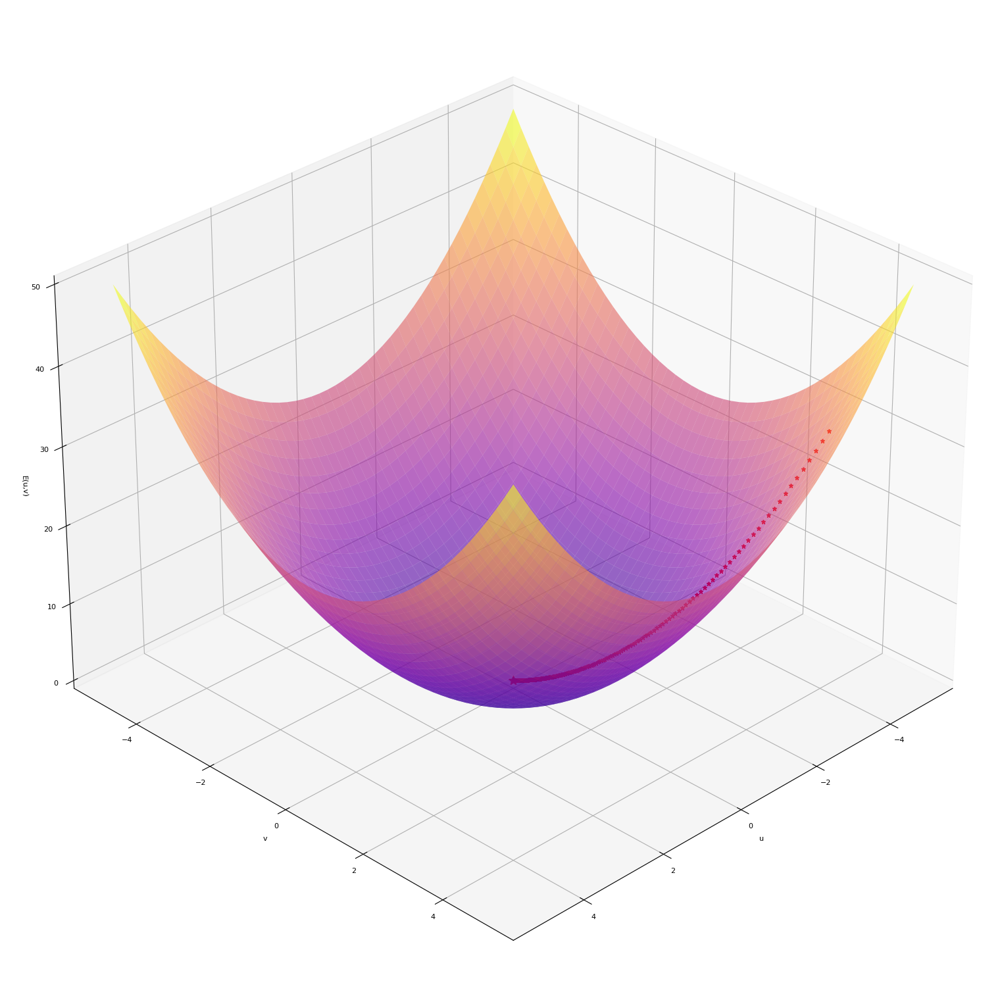

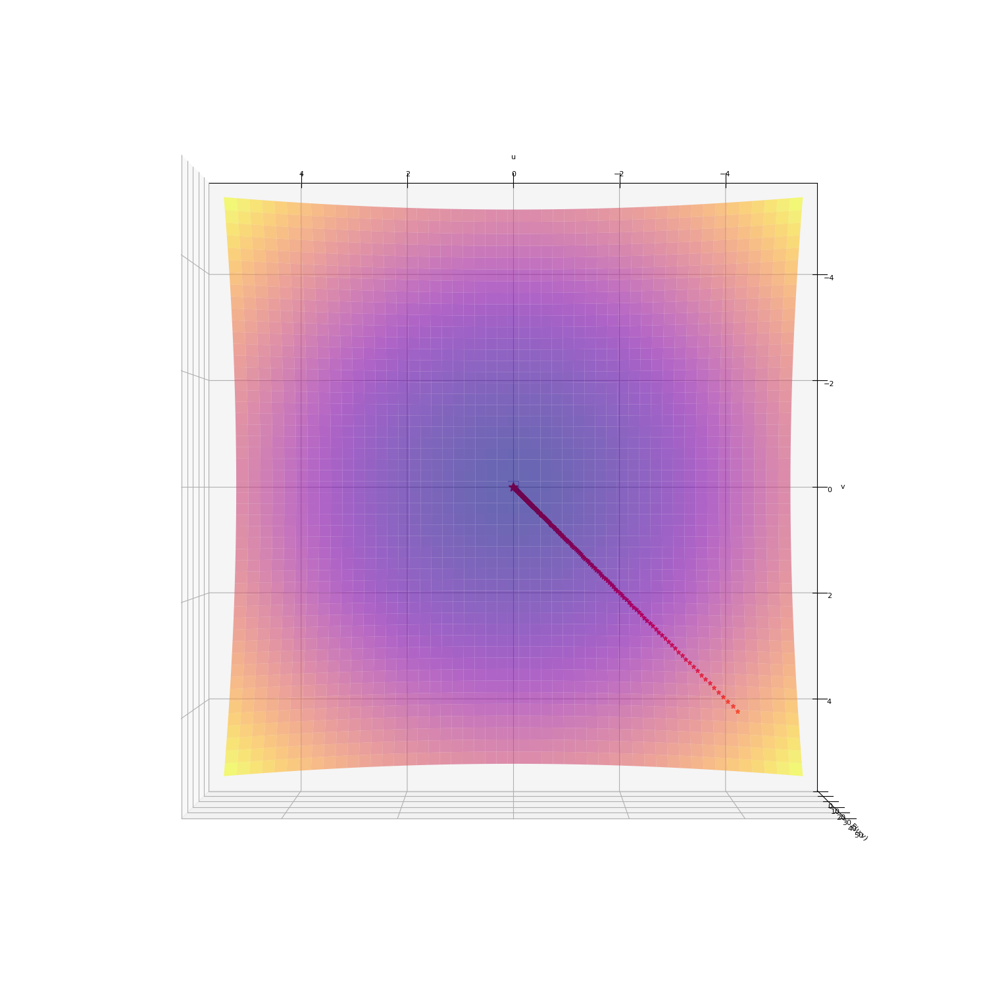

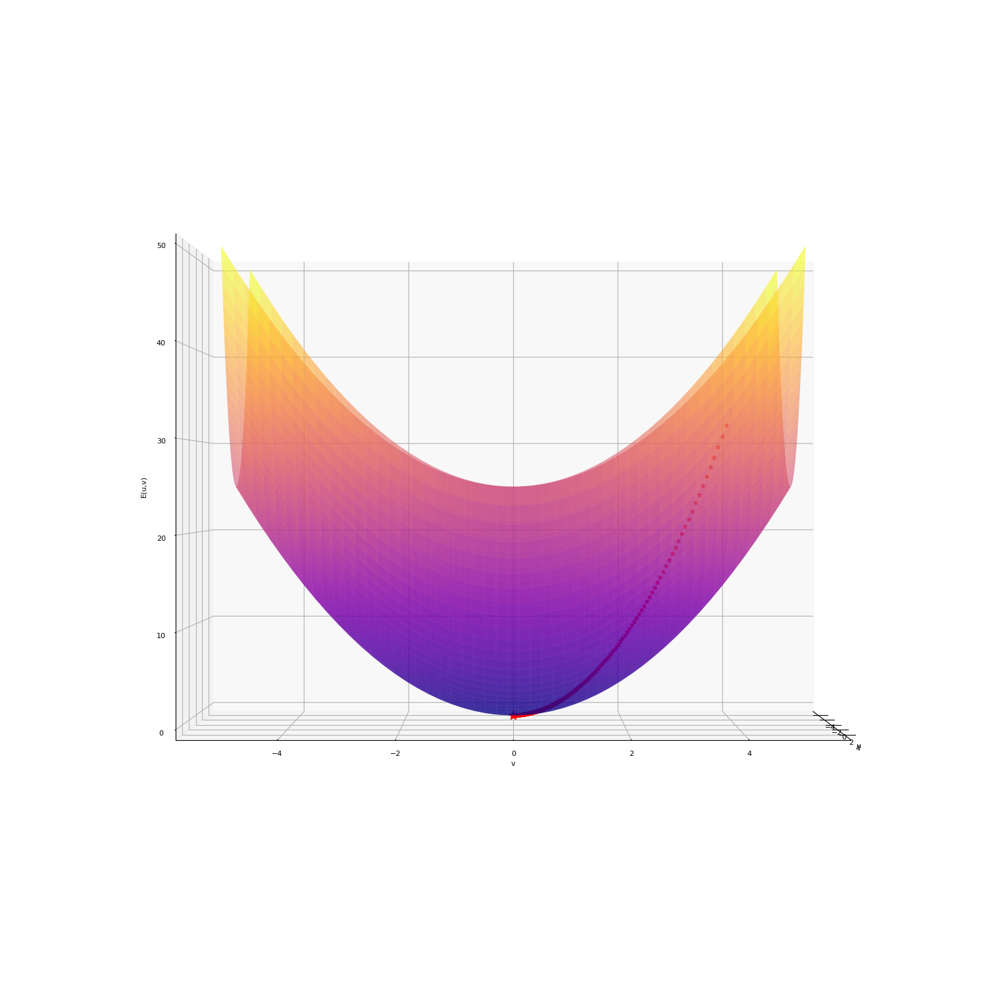

In [488]:
def E(w):
  u = w[0]
  v = w[1]
  return u**2.0 + v**2.0

# Derivada parcial de E respecto de u
def E_u(w):
    u = w[0]
    return 2.0*u

# Derivada parcial de E respecto de v
def E_v(w):
    v = w[1]
    return 2.0*v
    
# Gradiente de E
def gradE(w):
    return np.array([E_u(w), E_v(w)])

w, k, ws = gd(np.array([-4.0,4.0]), 0.01, gradE, E, 1e-50, show_evol = False)

display_figure(5, E, ws, [45,30], 'plasma','')
display_figure(5, E, ws, [90,90], 'plasma','')
display_figure(5, E, ws, [0,0], 'plasma','')

<font color='blue'>¿Cuántas iteraciones ha empleado el algoritmo hasta converger? ¿Qué punto ha alcanzado? Comente también si el comportamiento del algoritmo es el esperado y porqué lo considera así. </font>

Los resultados obtenidos son:

- Número de iteraciones: 2936
- Punto alcanzado: (-6.947334735484934e-26 ,  6.947334735484934e-26)
- Valor de la función en el punto $w$: 9.653091985375103e-51

El comportamiento es correcto ya que el punto alcanzado da un valor en la función menor al epsilon `1e-50` y por eso no ha ejecutado todas las iteraciones. Es prácticamente 0, al igual que el mínimo de la función convexa por lo que está bien minimizada.

In [489]:
print ('Numero de iteraciones: ', k)
print ('Coordenadas obtenidas: (', w[0], ', ', w[1],')')
print ('Valor de la función en el punto w: ', E(w))

Numero de iteraciones:  2936
Coordenadas obtenidas: ( -6.947334735484934e-26 ,  6.947334735484934e-26 )
Valor de la función en el punto w:  9.653091985375103e-51


#### <font color='blue'>b) Realizar la misma operación que en el apartado (a), pero con el gradiente normalizado. ¿Qué diferencias se observan?</font> 

El **Gradiente Normalizado** es una variante del gradiente descendente en la cual el peso $w$ se normaliza dando saltos equitativos en cada iteración.

La implementación es exactamente la misma, la única diferencia es el uso de `np.linalg.norm` que normaliza el peso $w$. 

La diferencia principal está en la ejecución del algoritmo:
- Podemos ver en el dibujo que los pesos cambian mucho menos dando saltos tan cortos que parece una linea.
- Si activamos el `show_evol` podemos verificar como $w$ llega al máximo de iteraciones y es mucho más lento minimizando que el Gradiente sin normalizar.

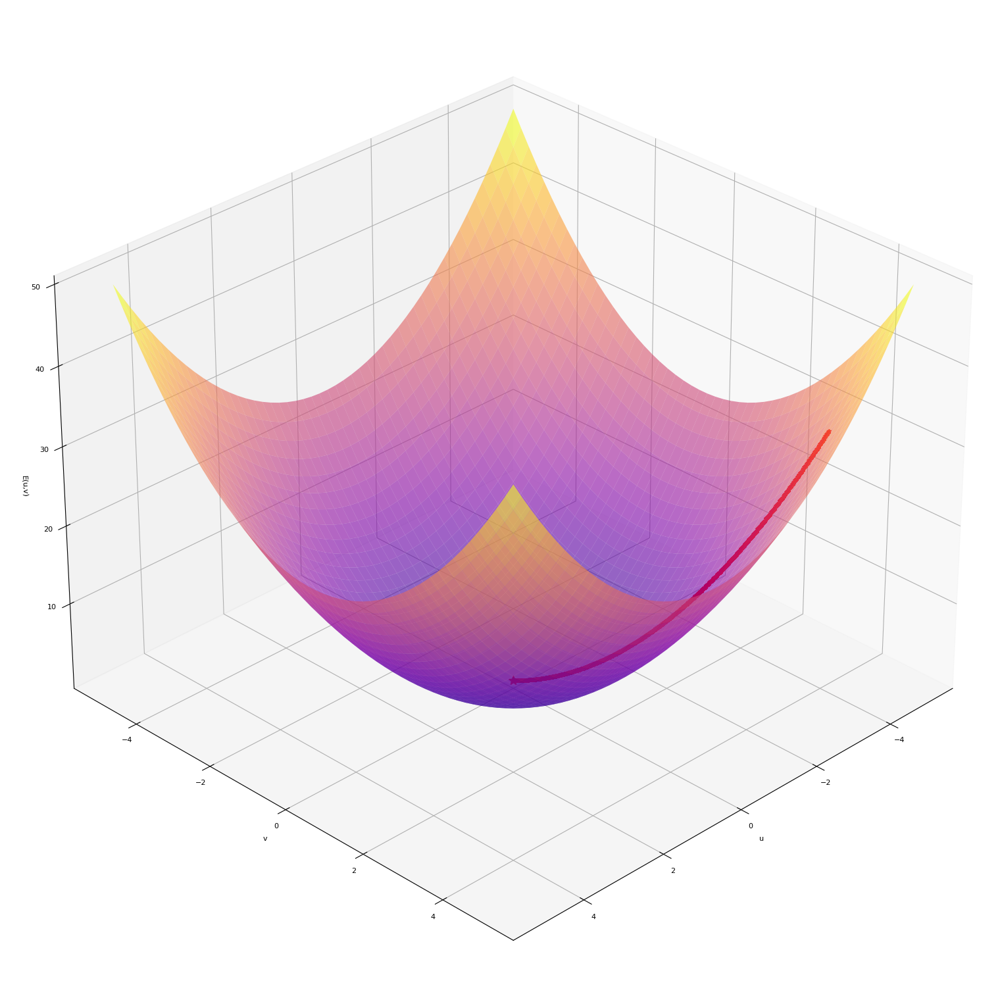

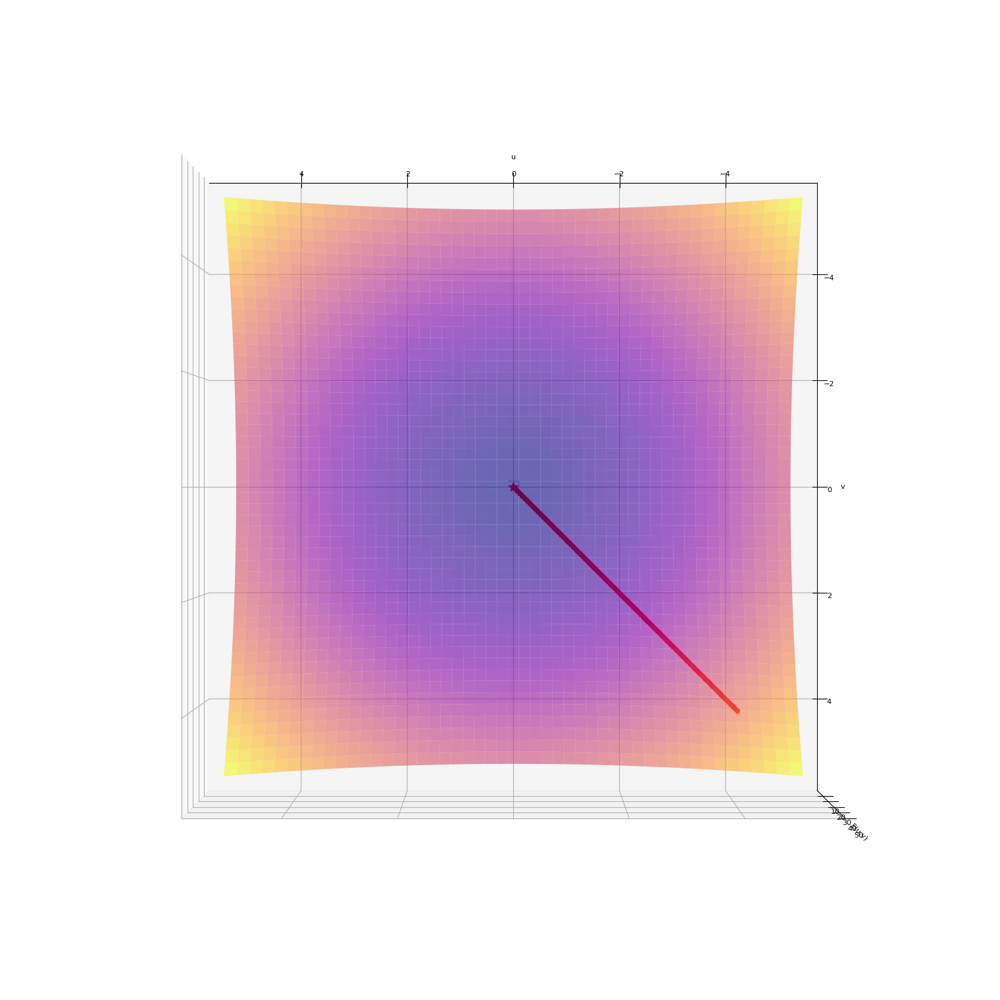

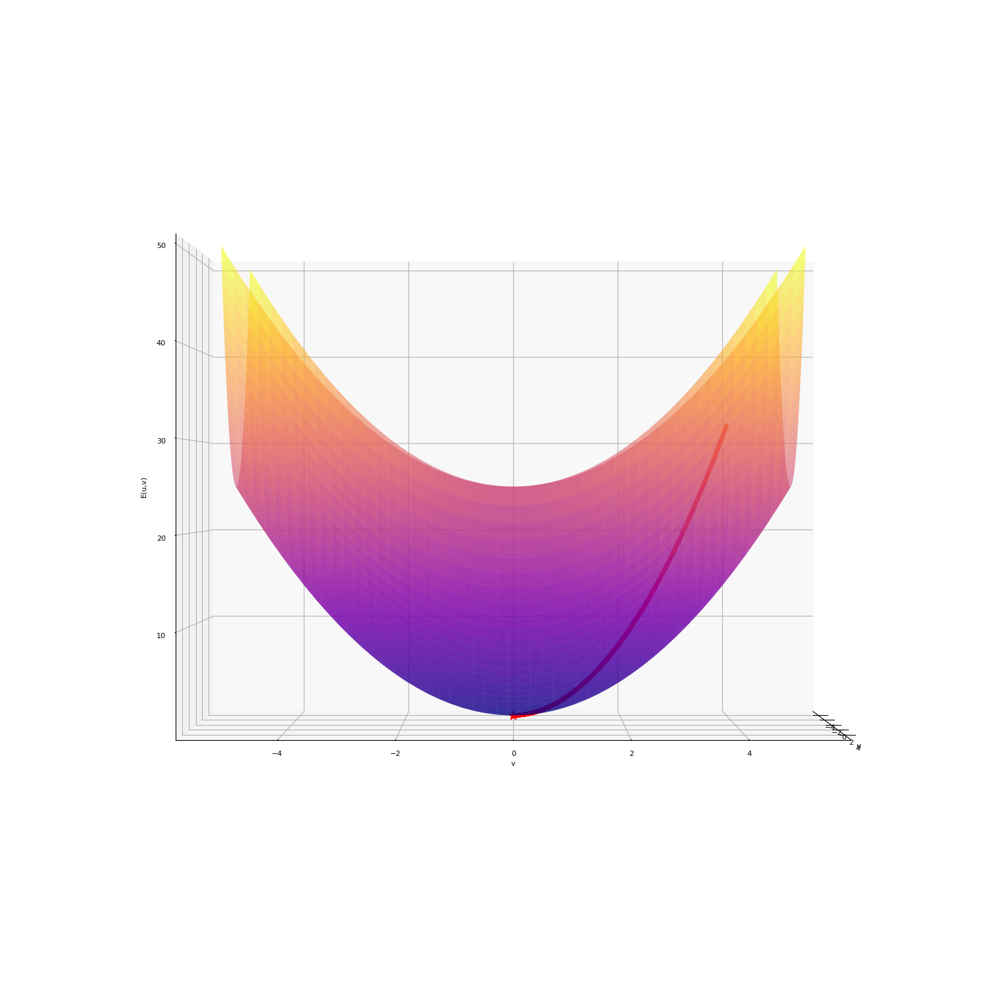

In [490]:
'''
Esta función es idéntica a la anterior, pero la actualización de w se realiza con el gradiente normalizado
'''
def gd_normalizado(w_ini, lr, grad_fun, fun, epsilon, max_iters = 100000, show_evol = False):
    it = 0
    w = w_ini.copy()
    ws = []
    ws.append(w)
    if show_evol:
      print('w_ini = ', w)
      print(fun(w))
      print(grad_fun(w))

    # Criterio de parada: numero de iteraciones y 
    # valor de f inferior a epsilon
    while it < max_iters and fun(w) >= epsilon:
        w = w - lr*gradE(w)/np.linalg.norm(grad_fun(w))
        ws.append(w)
        if show_evol:
          print('w_{} = {}'.format(it,w))
          print(fun(w))
          print(grad_fun(w))
        it += 1

    return w, it, ws

w, k, ws = gd_normalizado(np.array([-4.0,4.0]), 0.01, gradE, E, 1e-50, show_evol = False)
display_figure(5, E, ws, [45,30], 'plasma','')
display_figure(5, E, ws, [90,90], 'plasma','')
display_figure(5, E, ws, [0,0], 'plasma','')

Efectivamente llega al máximo de iteraciones y el punto obtenido aún siendo casi 0 no termina de llegar al mínimo de verdad. Es más lento minimizando que el Gradiente Descendente (sin minimizar) y da peores resultados.

In [491]:
print ('Numero de iteraciones: ', k)
print ('Coordenadas obtenidas: (', w[0], ', ', w[1],')')

Numero de iteraciones:  100000
Coordenadas obtenidas: ( 0.0022243815158106035 ,  -0.0022243815158106035 )


### <font color='blue'>(2 puntos) Influencia del learning rate. 

Considérese la función $E(u, v) = u^2 + 2v^2 + 2sin(2  \pi  u) sin(\pi  v)$</font>




#### <font color='blue'>a)  Calcular analíticamente y mostrar la expresión del gradiente de la función $E(u, v)$. Visualizar en 3D dicha función.</font>


Al igual que ocurrió con la función E, para poder trabajar con el algoritmo y obtener el gradiente, es necesario calcular las derivadas parciales de la función respecto a $u$ y $v$:
- **Derivada parcial respecto a u:** $2u+4\pi·cos(2\pi u)·sin(\pi v)$
- **Derivada parcial respecto a v:** $4v+2\pi·sin(2\pi u)·cos(\pi v)$

Para obtener el gradiente de una función basta con aplicar en cada punto, la derivada de $u$ y $v$ y formar un nuevo punto.

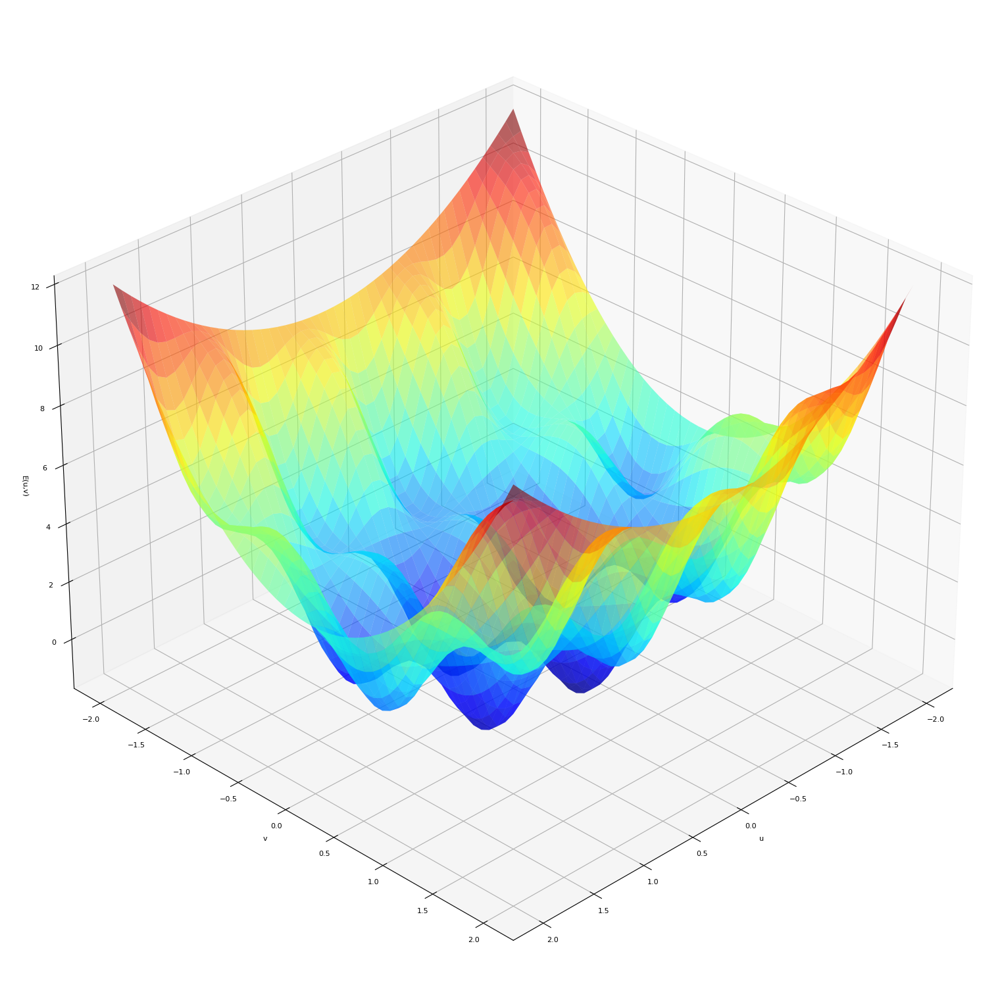

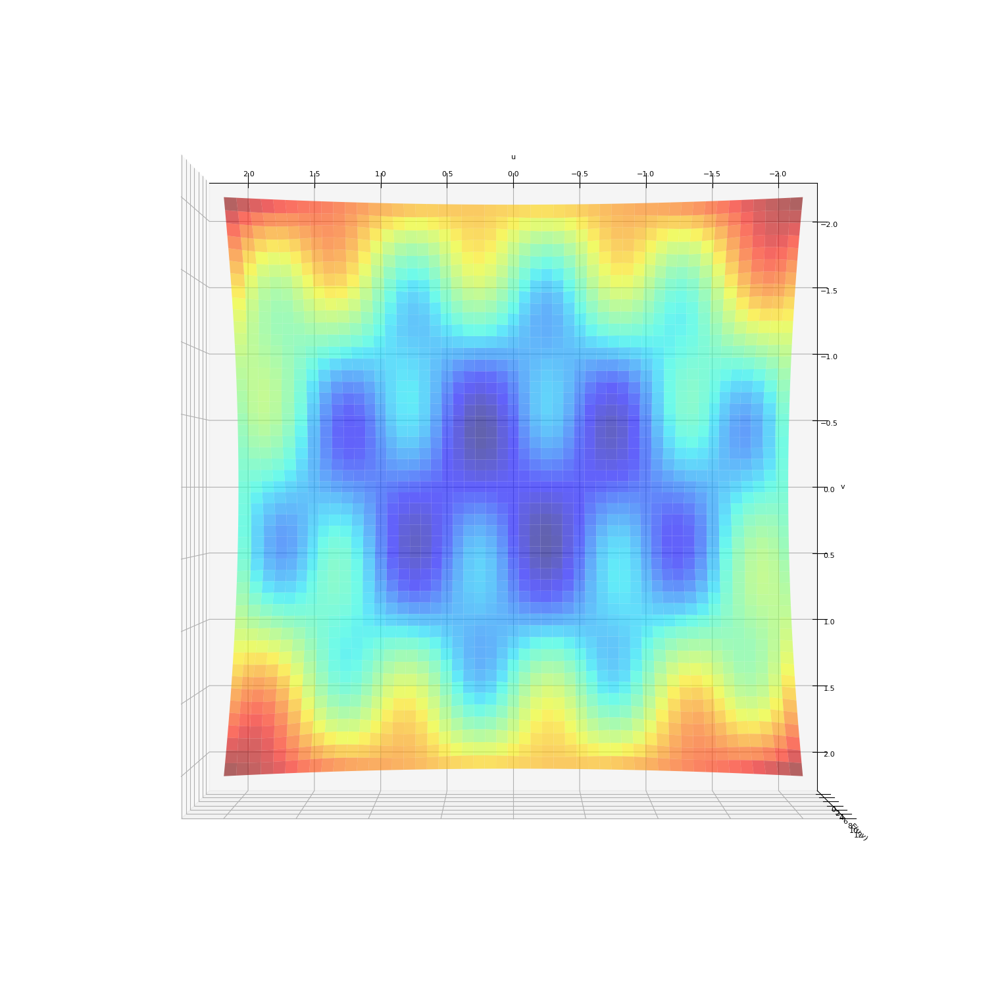

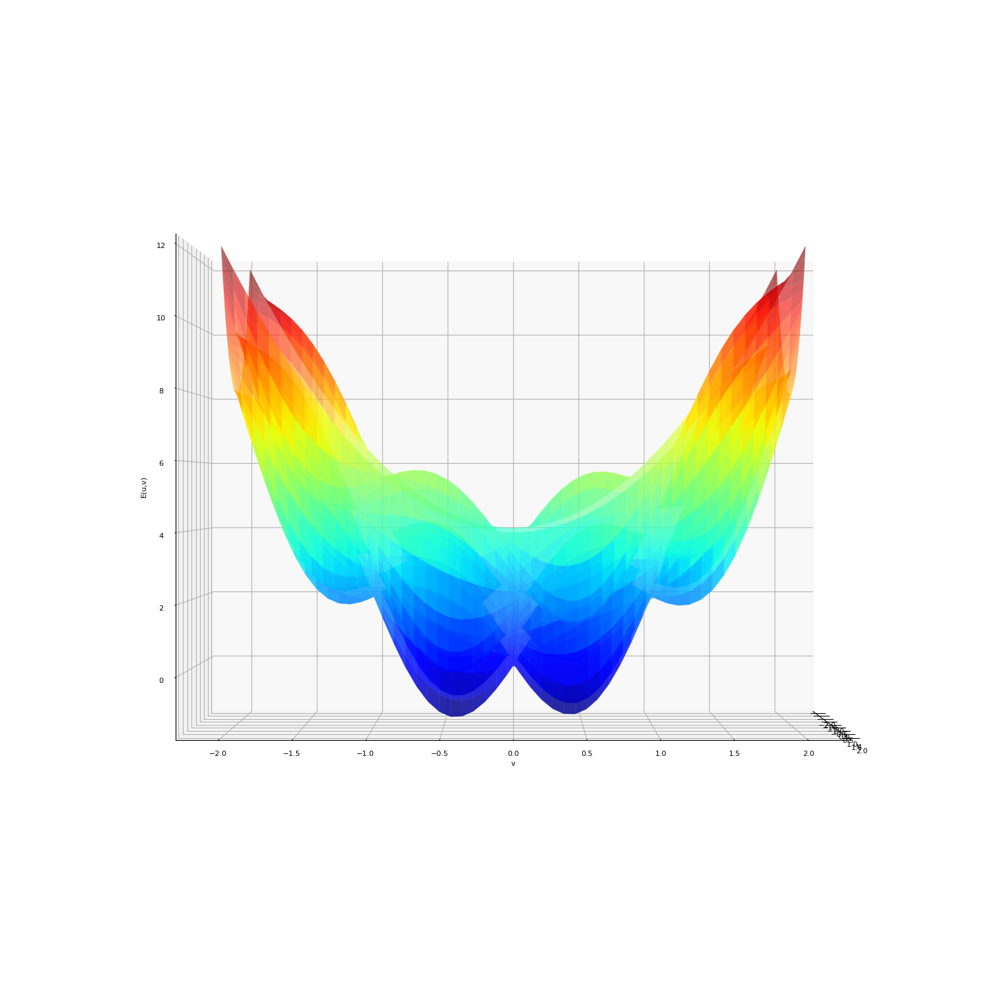

In [492]:
def E(w):
  u = w[0]
  v = w[1]
  return u**2.0+2.0*v**2.0+2.0*np.sin(2.0*np.pi*u)*np.sin(np.pi*v)

display_figure(2, E, [],  [45,30], 'jet', [])
display_figure(2, E, [],  [90,90], 'jet', [])
display_figure(2, E, [],  [0,0], 'jet', [])
    
# Derivada parcial de E respecto de u
def Eu(w):
  u = w[0]
  v = w[1]
  return 2*u+4*np.pi*np.cos(2*np.pi*u)*np.sin(np.pi*v)

# Derivada parcial de E respecto de v
def Ev(w):
  u = w[0]
  v = w[1]
  return 4*v+2*np.pi*np.sin(2*np.pi*u)*np.cos(np.pi*v)
    
# Gradiente de E
def gradE(w):
    return np.array([Eu(w), Ev(w)])

#### <font color='blue'>b) Emplear gradiente descendente para minimizar esta función con distintos valores de learning rate ($\eta$). 
Usar como punto inicial $(-1, 1)$, tasa de aprendizaje $\eta = 0.01$ y un máximo de $100$ iteraciones. Generar un gráfico 2D que muestre cómo desciende el valor de la función (eje $Y$) con las iteraciones (eje $X$). </font>


Para la minimización de esta función, en este caso no hay una cota inferior que sea indicada, sino que se advierte que el algoritmo no debe superar las 100 iteraciones. Además, esta vez es necesario guardar por cada punto su valor, por eso se ha modificado la función de gradiente añadiendo los valores en el vector `graf`.

Observamos en la gráfica que con un learning rate de $0.01$ disminuye rápidamente y se estanca cerca del 0.


Grafica con learning rate igual a 0.01
w = [-1.21775622  0.41341212]
fun(w) = -0.06230891024214413


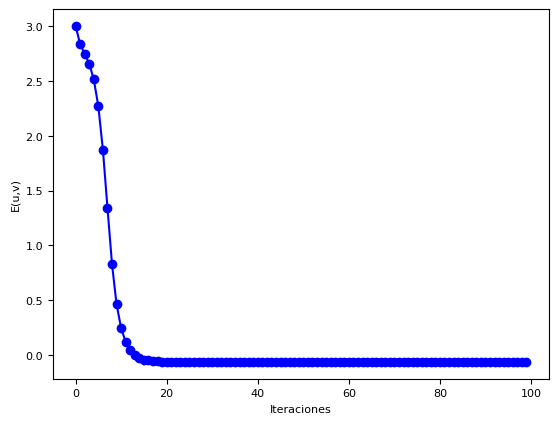

In [493]:
'''
Nueva versión del gradiente descendente en donde no se usa un epsilon como termination criterion.
En esta ocasión, el algoritmo se ejecuta siempre por un número máximo determinado de iteraciones. 
Junto con ello, se guardan los valores de la función en cada iteración del algoritmo. Y, finalmente, 
realiza la visualización de dichos valores en 2D. 

El alumnado, si lo prefiere, puede implementar una única función de descenso de gradiente que, 
dados los parámetros adecuados, realice esta visualización directamente. Es decir, no es obligatorio
implementar dos funciones de descenso de gradiente. 
'''
def gd_grafica(w, lr, grad_fun, fun, max_iters = 100):
    graf = [fun(w)]
    for k in range(1,max_iters):
        w = w - lr*gradE(w)
        graf.append(fun(w)) 
    print('w =', w)    
    print('fun(w) =', fun(w))
    plt.figure()
    plt.plot(range(0,max_iters), graf, '-bo')
    plt.xlabel('Iteraciones')
    plt.ylabel('E(u,v)')
    plt.show()

    return graf

print ('\nGrafica con learning rate igual a 0.01')
graf1 = gd_grafica(np.array([-1.0,1.0]) , 0.01, gradE, E)


En el plano vemos como llega a un mínimo local de la función. 

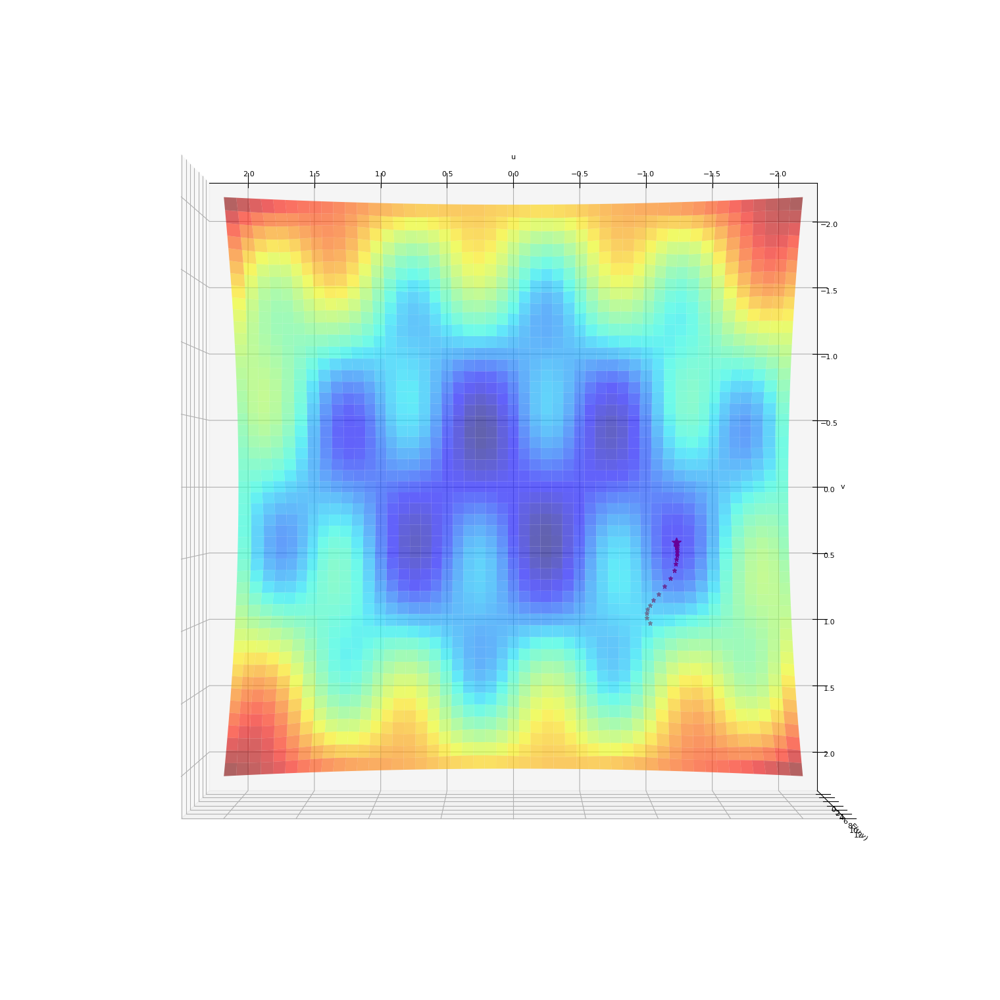

In [494]:
w, k, ws = gd(np.array([-1.0,1.0]), 0.01, gradE, E, float('-inf'), max_iters = 100, show_evol = False)
display_figure(2, E, ws, [90,90], 'jet','')

<font color='blue'>Repetir el experimento pero usando $\eta = 0.1$, comentar las diferencias y su dependencia de $\eta$.</font>

La **tasa de aprendizaje** es un factor importante en la aplicación del algoritmo del Gradiente Descendente. Como se ha mencionado, este valor controla la velocidad a la que avanza el algoritmo. Puede apreciarse que si la tasa de aprendizaje elegida es más pequeña le es mucho más difı́cil salir de un mı́nimo local.

En la siguiente gráfica, donde el valor de la tasa de aprendizaje es mayor, el algoritmo no se ha quedado atascado en un mı́nimo local. Sin embargo, esto no quiere decir que a mayor tasa de aprendizaje mejor optimizará el algoritmo la búsqueda de un mı́nimo, ya que dar saltos muy grandes analizando la función puede desencadenar en pasar por alto un mejor mı́nimo que los encontrados hasta el momento. Cada función, por tanto tendrá un ajuste específico de este valor.

w = [ 0.11131064 -0.00237237]
fun(w) = 0.002805657285235335


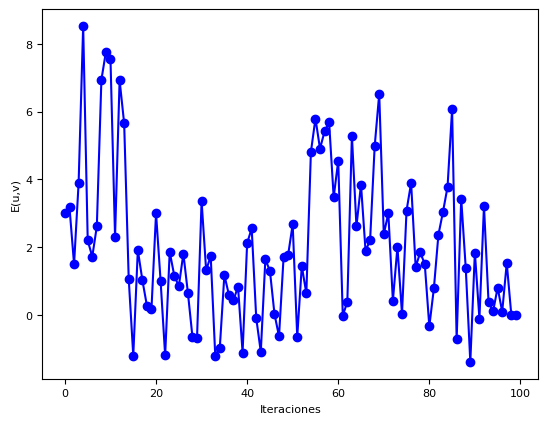

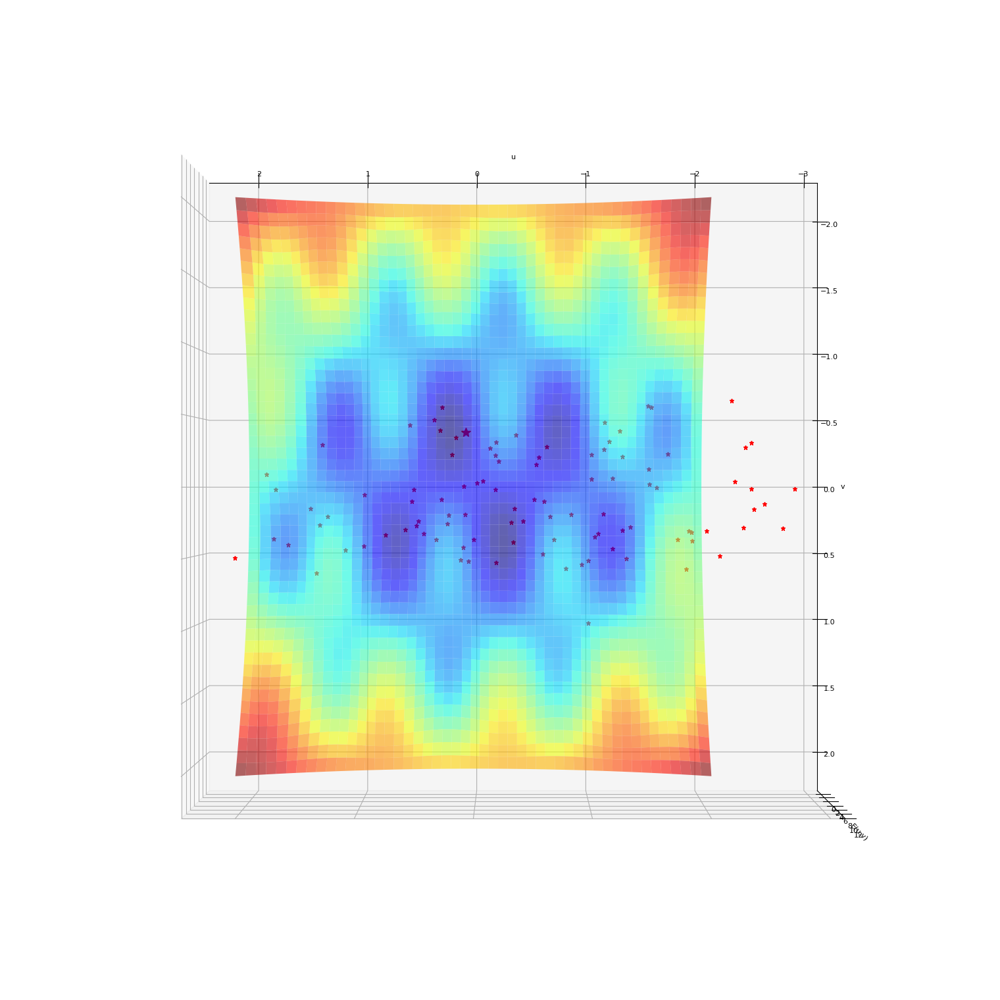

In [495]:
lr = 0.1
graf2 = gd_grafica(np.array([-1.0,1.0]) , lr, gradE, E)
w, k, ws = gd(np.array([-1.0,1.0]), lr, gradE, E, float('-inf'), max_iters = 100, show_evol = False)
display_figure(2, E, ws, [90,90], 'jet','')

Extra:

Si probamos con un learning rate demasiado bajo, observamos que el algoritmo se vuelve demasiado lento llegando a no converger con pocas iteraciones.

w = [-1.20930714  0.56102738]
fun(w) = 0.1923985288750909


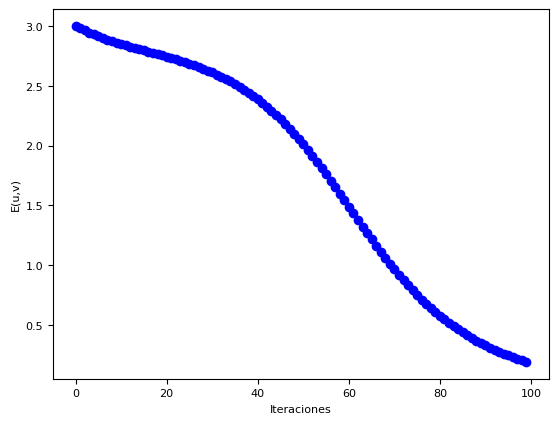

In [496]:
lr = 0.001
graf3 = gd_grafica(np.array([-1.0,1.0]) , lr, gradE, E)

Aquí dejo una comparativa entre los learning rates:

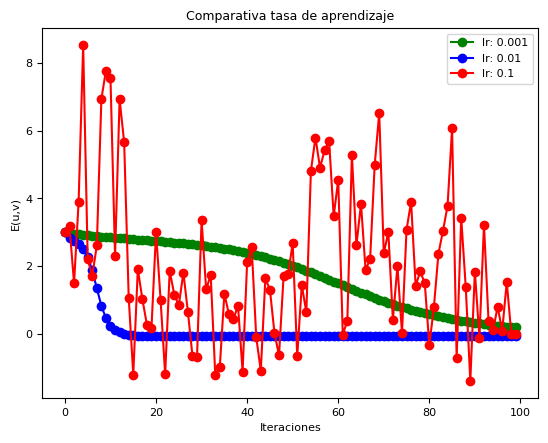

In [497]:
plt.figure()
plt.plot(range(0,100), graf3, '-go', label="lr: 0.001")
plt.plot(range(0,100), graf1, '-bo', label="lr: 0.01")
plt.plot(range(0,100), graf2, '-ro', label="lr: 0.1")
plt.xlabel('Iteraciones')
plt.ylabel('E(u,v)')
plt.legend()
plt.title("Comparativa tasa de aprendizaje")
plt.show()

### <font color='blue'>(2 puntos) Influencia del punto inicial y del learning rate. 

Considérese ahora la función $E(u,v) = -cos(u) \cdot cos(v) \cdot e^{(-((u \cdot \pi)^2 + (u + \pi)^2))}$. Calcular analíticamente y mostrar la expresión del gradiente de la función $E(u, v)$.</font>




Al igual que ocurrió con la función $E$, para poder trabajar con el algoritmo y obtener el gradiente, es necesario calcular las derivadas parciales de la función respecto a $u$ y $v$:
- **Derivada parcial respecto a u:** $e^{-\pi^2 u^2 - (u + \pi)^2}·(2(u + \pi^2 u + \pi)·cos(u) + sin(u))·cos(v)$
- **Derivada parcial respecto a v:** $e^{-\pi^2 u^2 - (u + \pi)^2}·sin(v)·cos(u)$

Para obtener el gradiente de una función basta con aplicar en cada punto, la derivada de $u$ y $v$ y formar un nuevo punto.

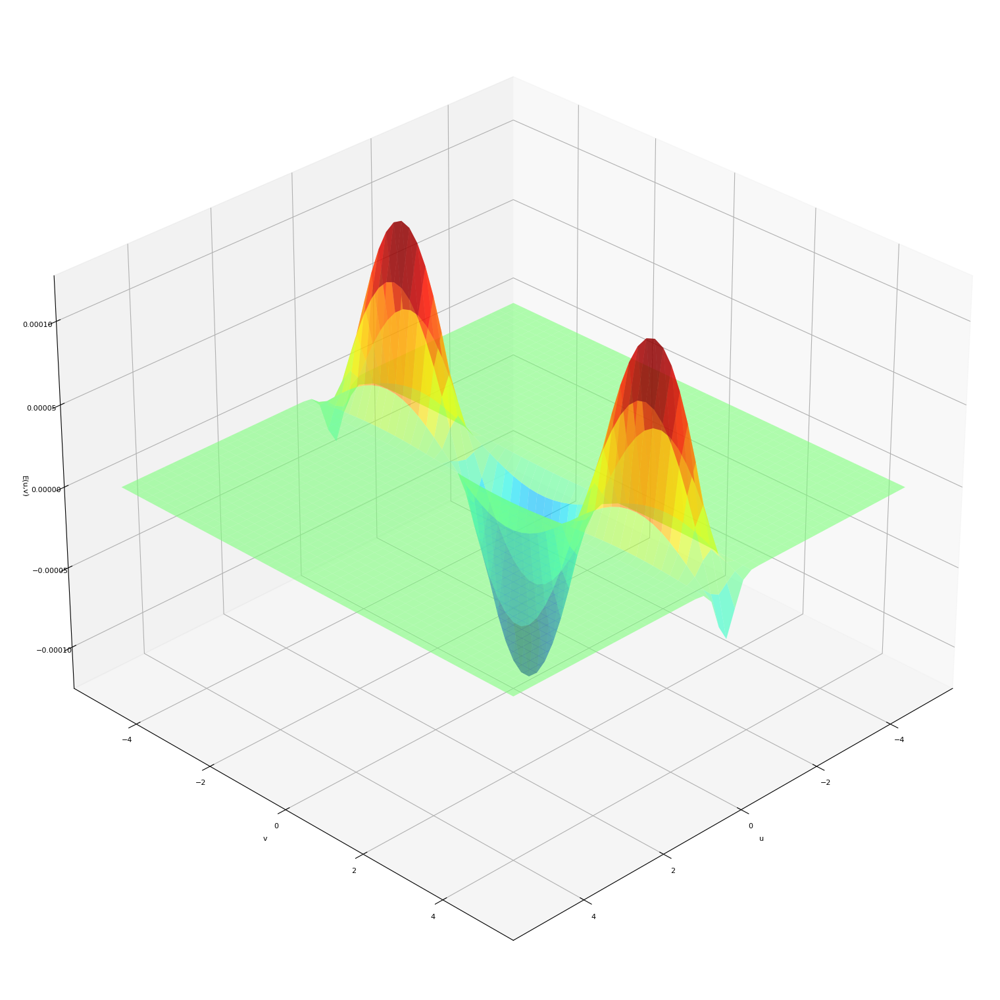

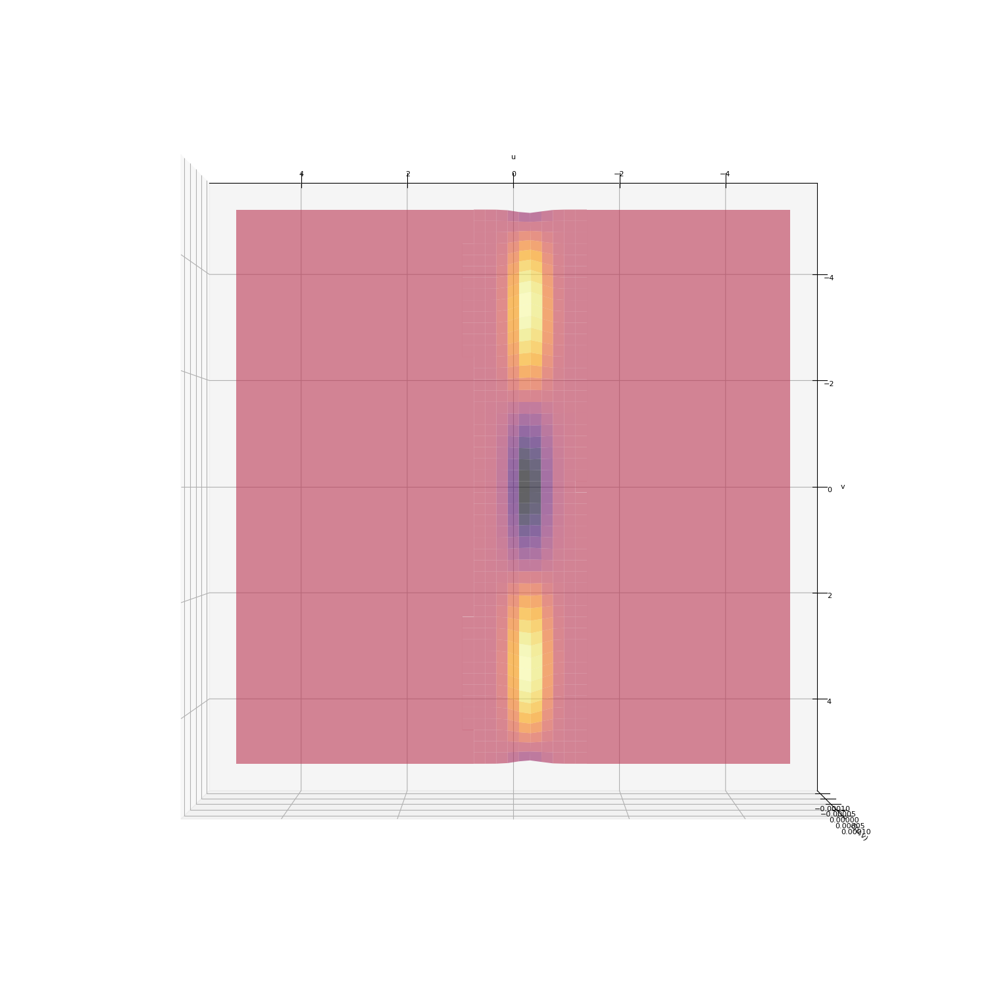

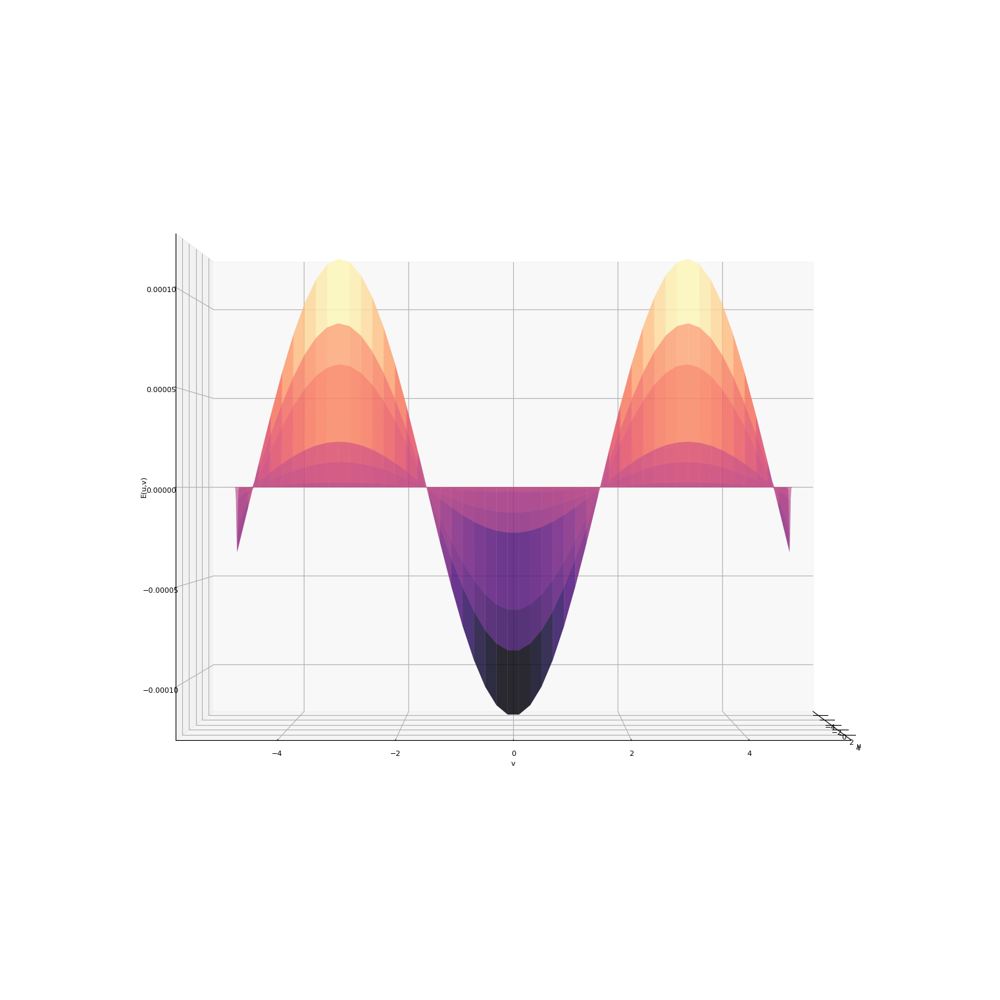

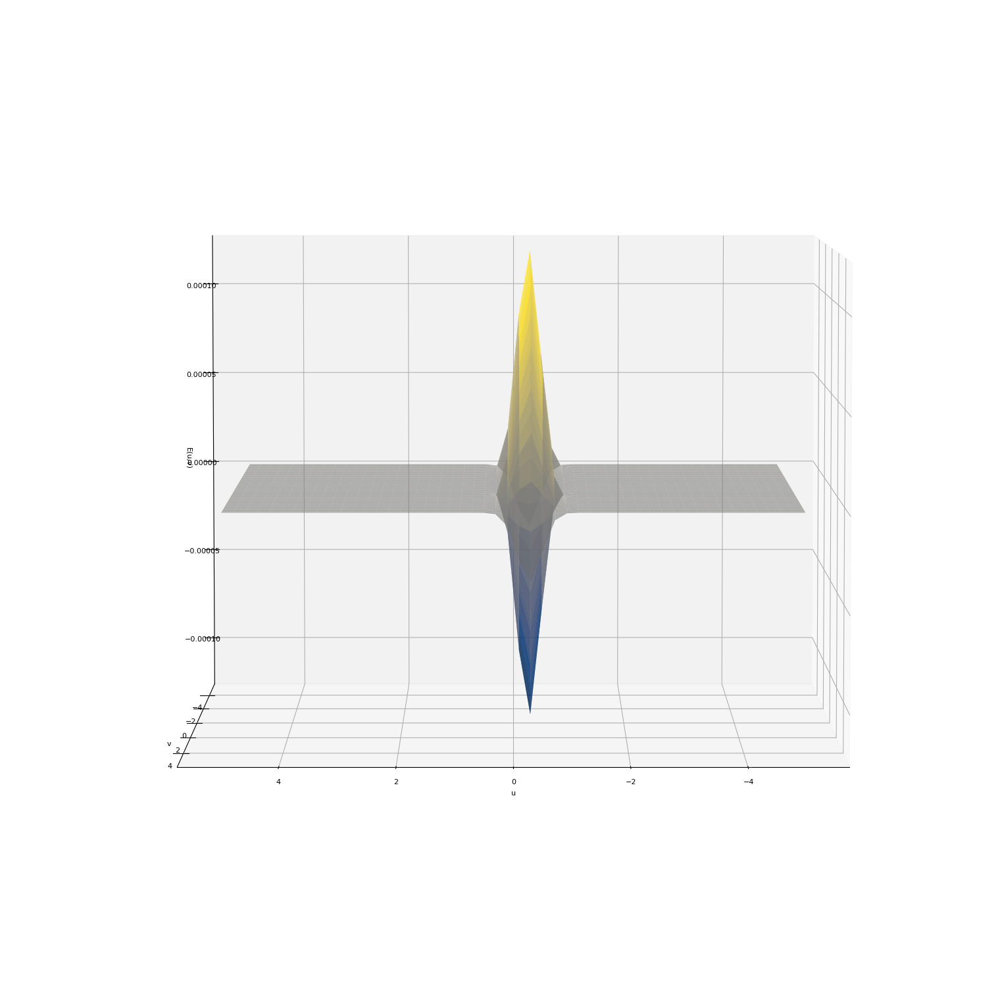

In [498]:
def E(w): 
  u = w[0]
  v = w[1]
  return -np.cos(u)*np.cos(v)*math.e**(-((u*math.pi)**2 + (u+math.pi)**2))
             
# Derivada parcial de E respecto de u
def Eu(w):
  u = w[0]
  v = w[1]
  return math.e**(-np.pi**2*u**2 - (u + np.pi)**2)*(2.0*(u + np.pi**2*u + np.pi)*np.cos(u) + np.sin(u))*np.cos(v)

# Derivada parcial de E respecto de v
def Ev(w):
  u = w[0]
  v = w[1]
  return math.e**(-np.pi**2*u**2 - (u + np.pi)**2)*np.sin(v)*np.cos(u)
    
# Gradiente de E
def gradE(w):
    return np.array([Eu(w), Ev(w)])

display_figure(5, E, [], [45,30], 'jet','')
display_figure(5, E, [], [90,90], 'inferno','')
display_figure(5, E, [], [0,0], 'magma','')
display_figure(5, E, [], [90,5], 'cividis','')

<font color='blue'>Úsese el gradiente descendente para encontrar un mínimo de esta función, comenzando desde los siguientes puntos iniciales: $(-4.0, 4.0), (-0.2,-3.0), (0.4,0.0), (-0.25,-2.0)$, usando dos tasas de aprendizaje ($0.1$ y $0.01$), y un número máximo de iteraciones de $250.000$. Debe mostrarse una tabla que asocie puntos iniciales y tasas de aprendizaje con las coordenadas alcanzadas y el valor de la función en dichos puntos finales. </font>

Inicialmente vemos gráficamente el comportamiento del algoritmo en cada uno de esos puntos. 

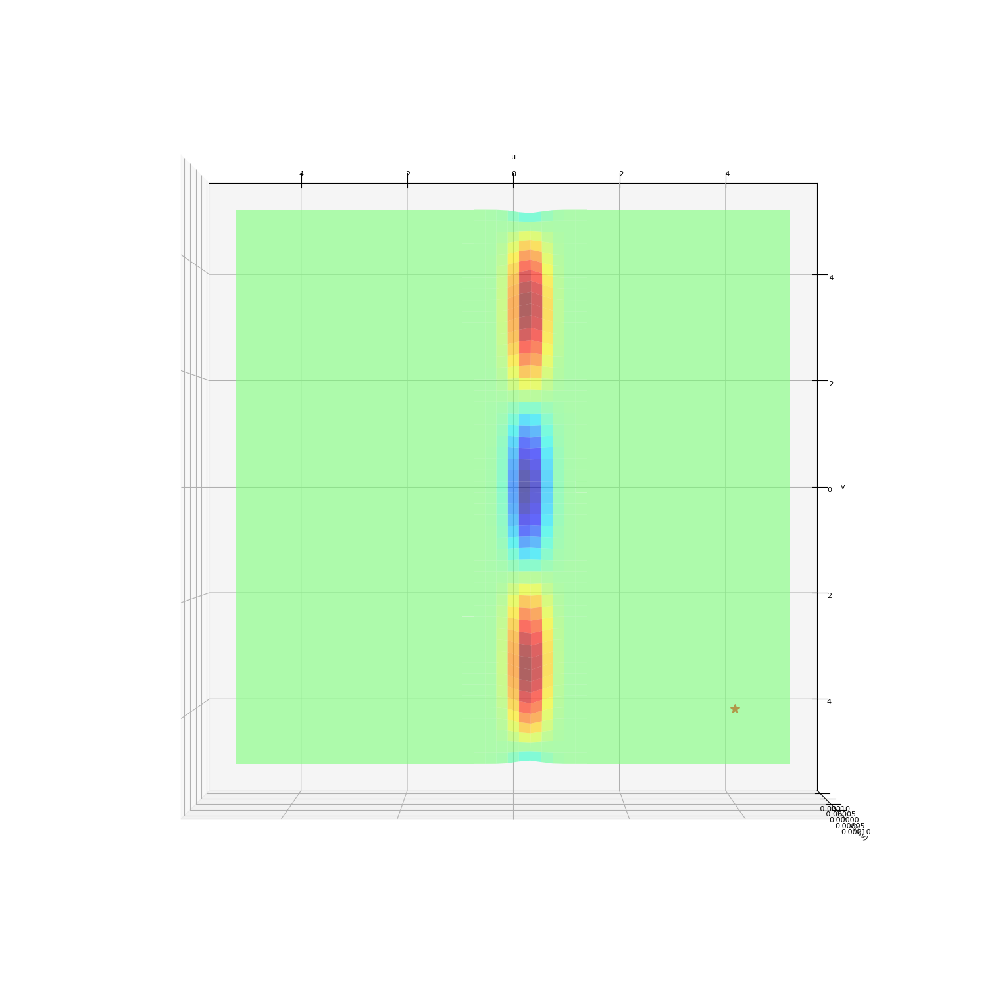

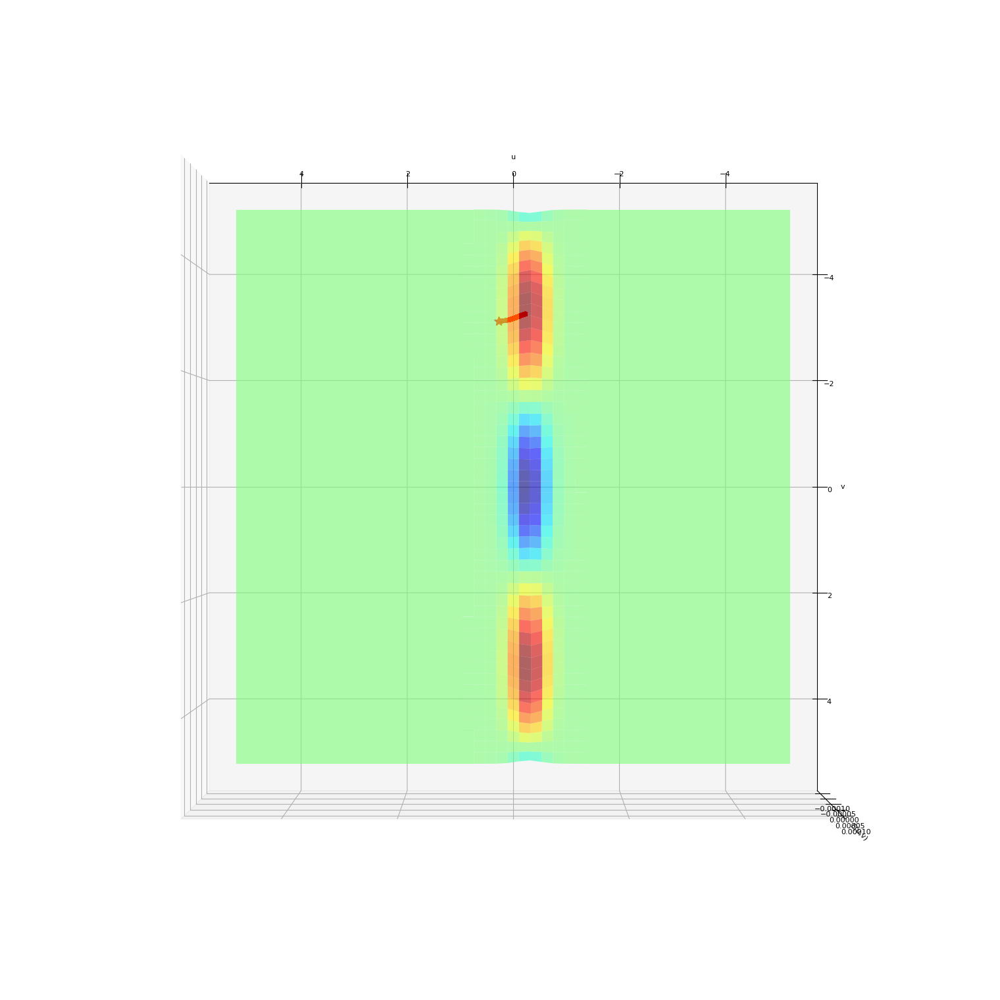

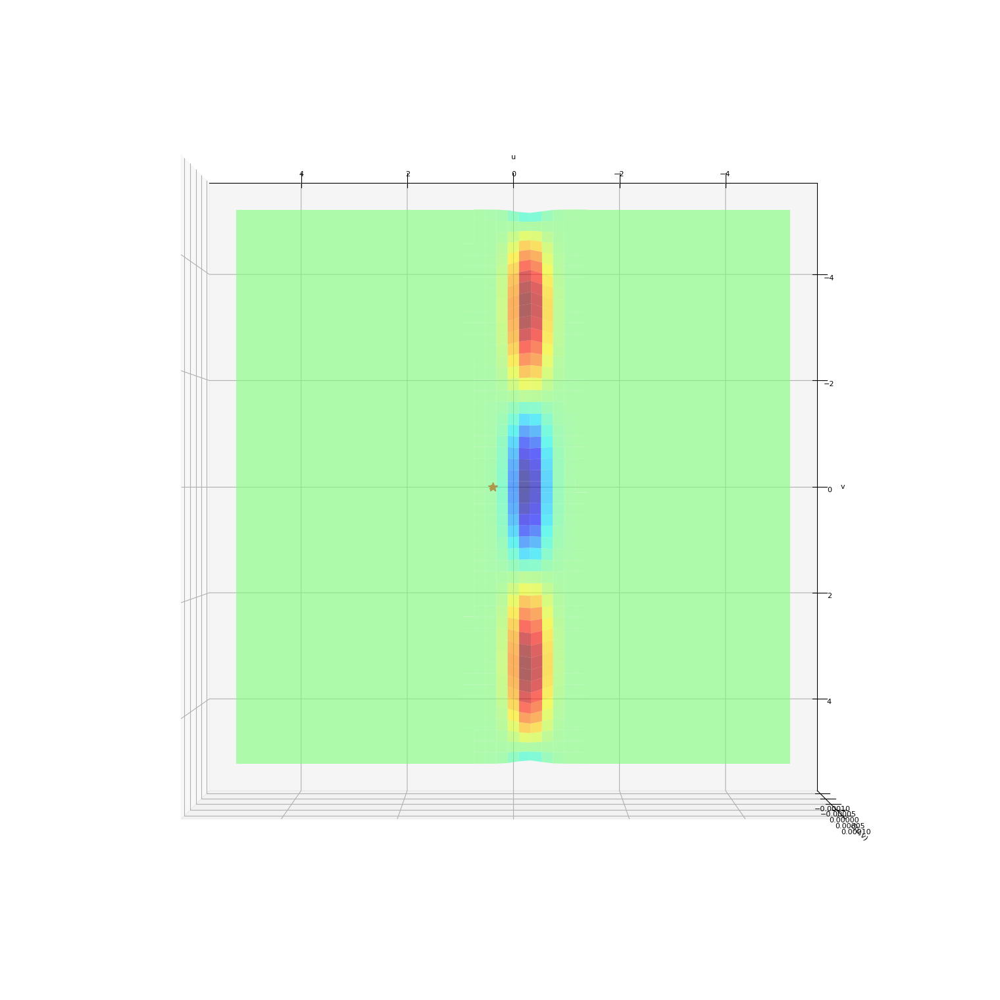

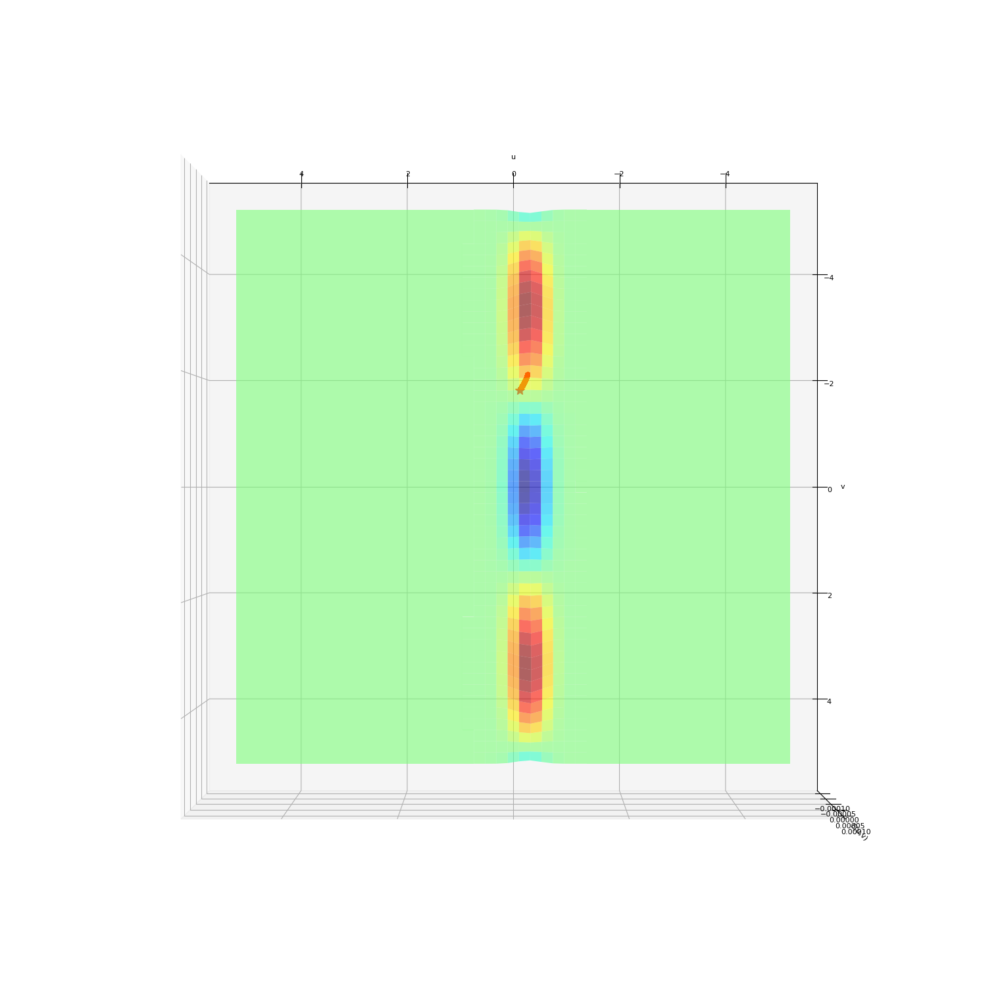

In [499]:
w, k, ws1 = gd(np.array([-4.0,4.0]), 0.01, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws2 = gd(np.array([-0.2,-3.0]), 0.01, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws3 = gd(np.array([0.4,0.0]), 0.01, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws4 = gd(np.array([-0.25,-2.0]), 0.01, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
display_figure(5, E, ws1, [90,90], 'jet','')
display_figure(5, E, ws2, [90,90], 'jet','')
display_figure(5, E, ws3, [90,90], 'jet','')
display_figure(5, E, ws4, [90,90], 'jet','')


Como podemos observar en las gráficas anteriores, con un **lr=0.01** encontramos los siguientes casos:
- En la coordenada `[-4.0,4.0]` el punto no se mueve por estar una "llanura", la función no cambia nada a su alrededor.
- En la coordenada `[-0.2,-3.0]` se encuentra en un máximo y desciende hacia un "minimo" que no es el global. Además, se queda a medio camino pues no está completamente fuera del máximo.
- En la coordenada `[0.4,0.0]` es incapaz de ver el mínimo que tiene al lado.
- En la coordenada `[-0.25,-2.0]` se queda a medio descenso de nuevo.

En cambio, si observamos las gráficas con un **lr=0.1** la situación mejora:
- En la coordenada `[-4.0,4.0]` el punto no cambia porque está demasiado lejos de cualquier mínimo.
- En la coordenada `[-0.2,-3.0]` observamos que sale completamente del máximo hacia un valor estable de la función.
- En la coordenada `[0.4,0.0]` es capaz de ver el mínimo a su lado e ir directo hacia él.
- En la coordenada `[-0.25,-2.0]` completa el recorrido desde el máximo hasta el mínimo más cercano.

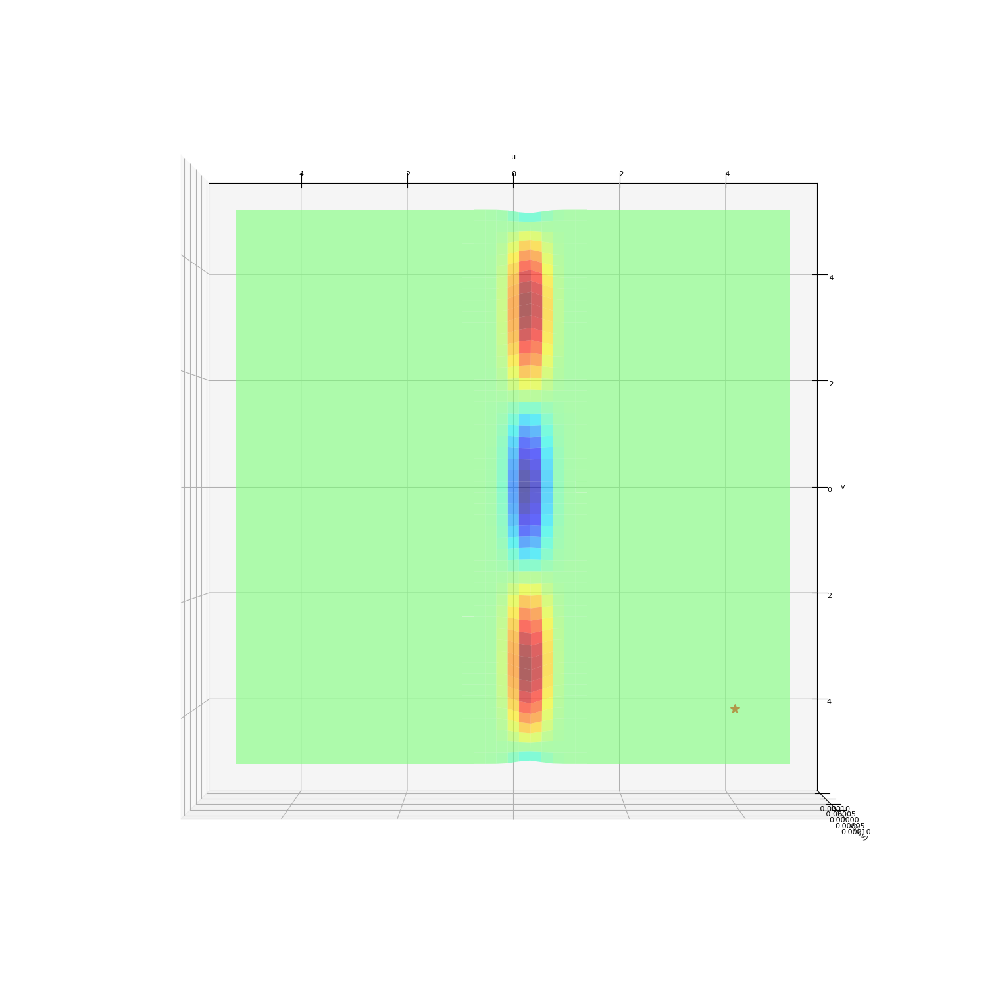

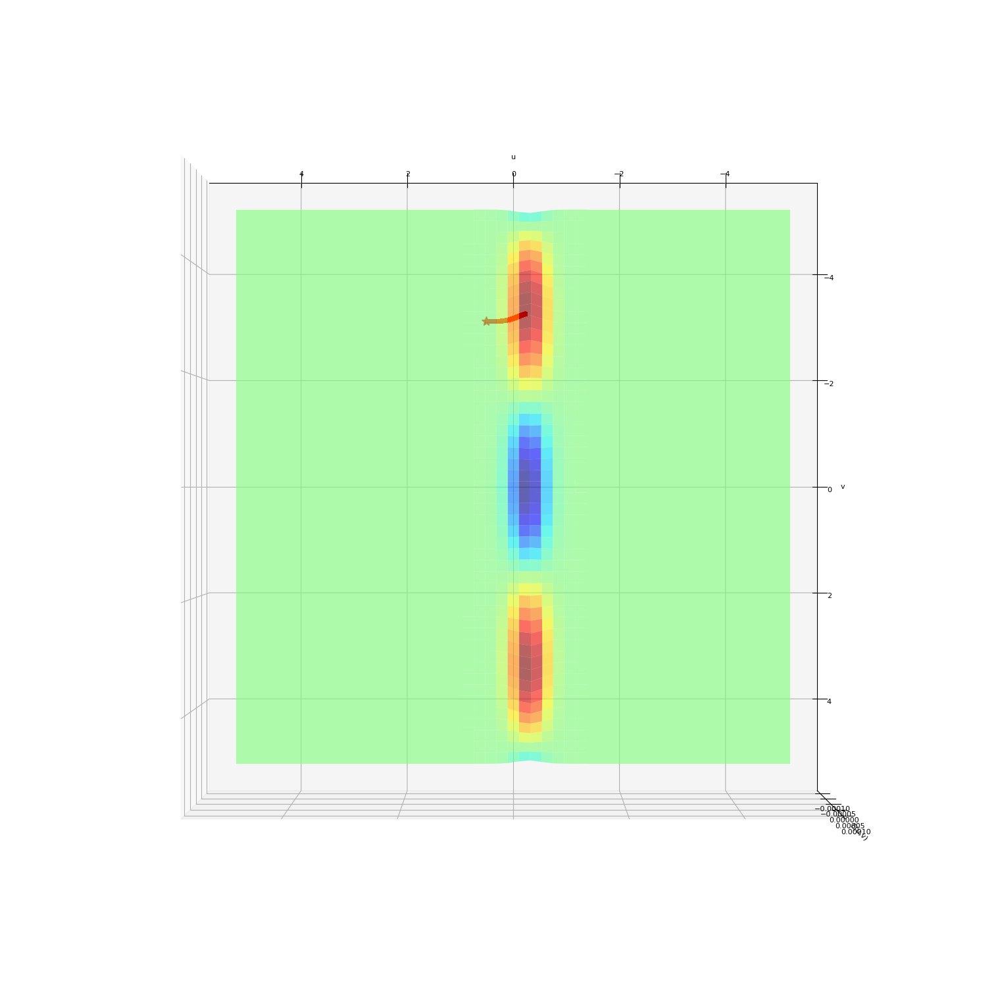

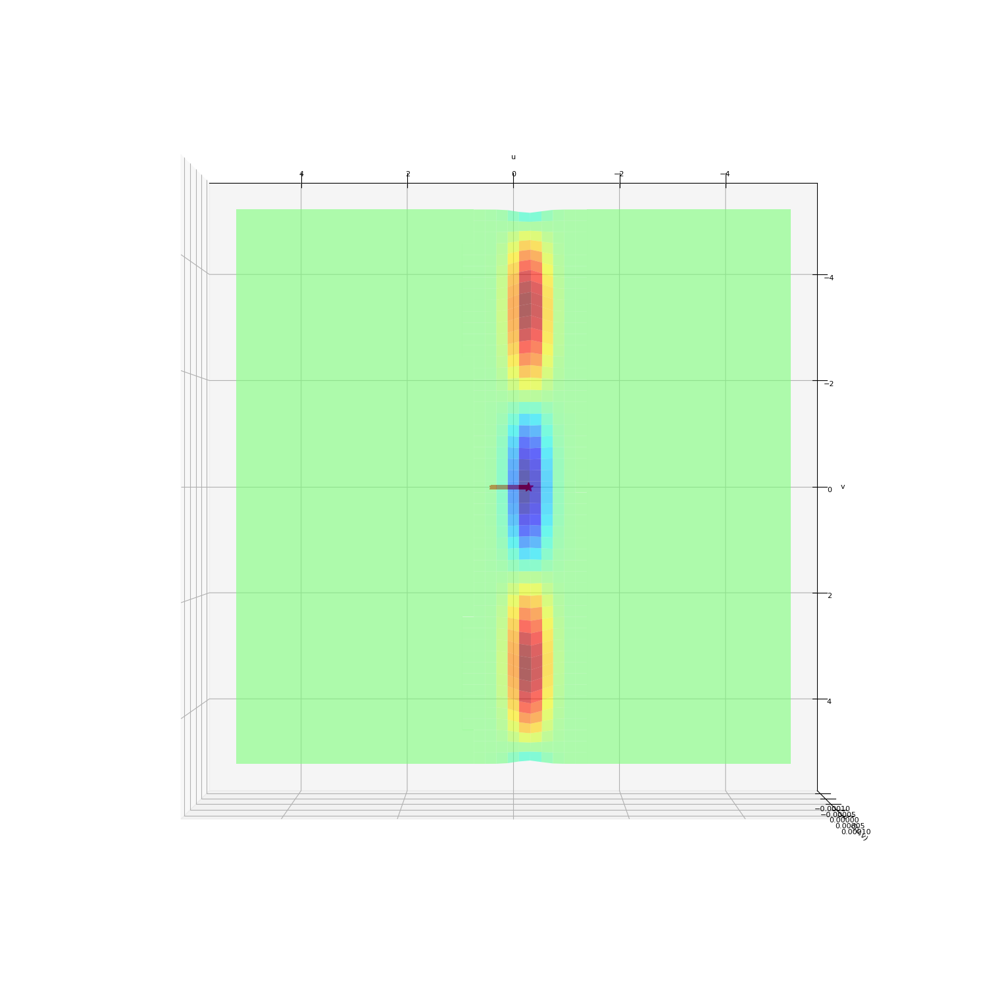

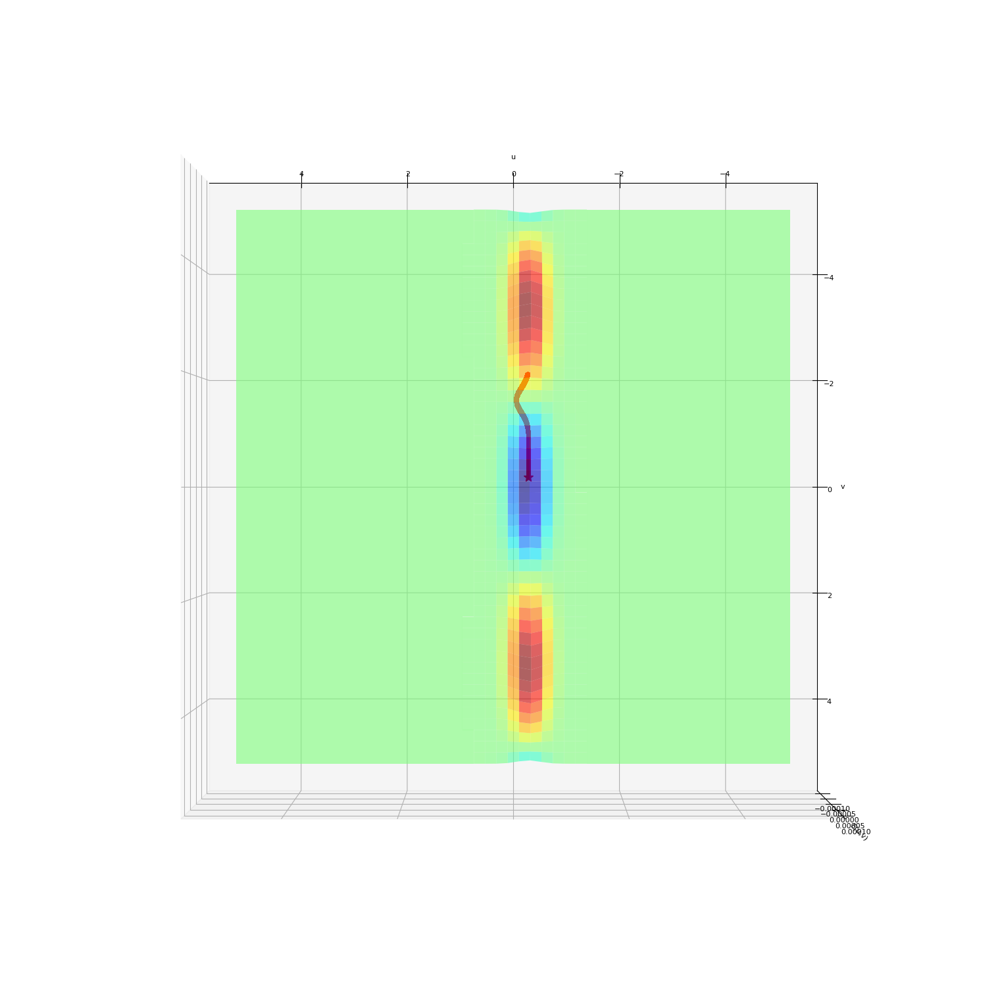

In [500]:
w, k, ws1 = gd(np.array([-4.0,4.0]), 0.1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws2 = gd(np.array([-0.2,-3.0]), 0.1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws3 = gd(np.array([0.4,0.0]), 0.1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
w, k, ws4 = gd(np.array([-0.25,-2.0]), 0.1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
display_figure(5, E, ws1, [90,90], 'jet','')
display_figure(5, E, ws2, [90,90], 'jet','')
display_figure(5, E, ws3, [90,90], 'jet','')
display_figure(5, E, ws4, [90,90], 'jet','')

Para la representación de la tabla usaremos panda. En un bucle for ejecutamos cada punto inicial con cada learning rate, guardamos el resultado en una lista. La lista se introduce en el dataframe y podemos ver la tabla.

**Análisis de la tabla**

- El mejor resultado se obtiene con la coordenada $[-0.25, -2.0]$ y learning rate $0.1$ con un valor de función de `-1.209964e-04`
- El peor resultado se obtiene con la misma coordenada pero con lr $0.01$
- En este caso concreto, el learning rate de $0.1$ es mejor (menor valor de función) en todas las coordenadas dadas excepto en $[-4.0,4.0]$ que empata con lr $0.01$

Como conclusión, hay que cambiar el learning rate según CUÁNTO cambie la función. Esta vez los valores cambian muy poco, en un rango de `[-1.209964e-04, 1.1415e-04]`. Es por eso que un **lr=0.01** es demasiado lento mientras que el **lr=0.1** se ajusta mucho mejor.

In [501]:
# Definimos los puntos iniciales
puntos_iniciales = [[-4.0,4.0],[-0.2,-3.0],[0.4,0.0],[-0.25,-2.0]]

# Definimos las tasas de aprendizaje
tasas_aprendizaje = [0.01, 0.1]

# Creamos una lista para almacenar los resultados
resultados = []

# Iteramos sobre los puntos iniciales y las tasas de aprendizaje
for punto_inicial in puntos_iniciales:
    for lr in tasas_aprendizaje:
        # Aplicamos el gradiente descendente para encontrar el mínimo
        w_, k, ws = gd(np.array(punto_inicial), lr, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
        # Almacenamos los resultados en una lista
        resultados.append([punto_inicial, lr, w_, E(w_)])

# Creamos un dataframe con los resultados
df_resultados = pd.DataFrame(resultados, columns=['Punto inicial', 'Tasa de aprendizaje', 'Coordenadas alcanzadas', 'Valor de la función'])

#Imprimimos el dataframe
display(df_resultados)

,Punto inicial,Tasa de aprendizaje,Coordenadas alcanzadas,Valor de la función
0,"[-4.0, 4.0]",0.01,"[-4.0, 4.0]",-5.365754e-70
1,"[-4.0, 4.0]",0.10,"[-4.0, 4.0]",-5.365754e-70
2,"[-0.2, -3.0]",0.01,"[0.2585585940844211, -2.9872406813812833]",4.706330e-06
3,"[-0.2, -3.0]",0.10,"[0.48440772507679136, -2.9848134533117094]",1.681594e-07
4,"[0.4, 0.0]",0.01,"[0.3677251903722714, 0.0]",-1.101223e-06
5,"[0.4, 0.0]",0.10,"[-0.27599715809941416, 0.0]",-1.231596e-04
6,"[-0.25, -2.0]",0.01,"[-0.11016895288557761, -1.7366086968952288]",1.485930e-05
7,"[-0.25, -2.0]",0.10,"[-0.27599715809941244, -0.1877010218244897]",-1.209964e-04


### <font color='blue'>(1 punto) ¿Cuál sería su conclusión sobre la verdadera dificultad de encontrar el mínimo global de una función arbitraria?</font>

Mi conclusión sobre la dificultad de encontrar el mínimo global de una función usando gradiente descendente es que depende de varios factores:

- En primer lugar, como dije antes, la **tasa de aprendizaje** (learning rate) es crítica para la convergencia del algoritmo. Si la tasa de aprendizaje es demasiado grande, el algoritmo puede hasta diverger y no converger hacia un mínimo global (como vimos en 1b). Si la tasa de aprendizaje es demasiado pequeña, el algoritmo puede converger muy lentamente y tardar mucho tiempo en encontrar el mínimo o no llegar a encontrarlo con un número limitado de iteraciones.

- Además, la **forma** de la función que se está optimizando también es importante. Si la función es **convexa**, el algoritmo de gradiente descendente converge rápidamente al <font color='green'>**mínimo global**</font>. Si la función <font color='red'>**no**</font> es convexa, el algoritmo puede converger a un <font color='blue'>**mínimo local**</font> en lugar del mínimo global.

- Otro factor a considerar es el **número de iteraciones** que el algoritmo de gradiente descendente necesita para converger. Si la función es muy compleja o el espacio de búsqueda es muy grande, el algoritmo puede tardar mucho tiempo en converger al mínimo global.

Por lo tanto, la dificultad para el algoritmo de gradiente descendente en encontrar un mínimo global en una función arbitraria dependerá de la tasa de aprendizaje, la forma de la función, el número de iteraciones y el espacio de búsqueda. Es importante probar diferentes valores de tasa de aprendizaje y número de iteraciones para encontrar los valores óptimos que permitan al algoritmo converger al mínimo global de manera eficiente.

## <font color='blue'>Ejercicio 2: REGRESIÓN LINEAL (5.5 puntos) </font>

### <font color='blue'>(2.5 puntos) Este ejercicio ajusta modelos de regresión a vectores de características extraídos a partir de imágenes de dígitos manuscritos. 

<font color='blue'>En particular, se extraen dos características concretas que miden el valor medio del nivel de gris y la simetría del dígito respecto de su eje vertical. Solo se seleccionarán para este ejercicio las imágenes de los números $1$ y $5$. </font>

<font color='blue'>Estimar un modelo de regresión lineal, a partir de los datos proporcionados por
los vectores de características dados, usando tanto el algoritmo
de la pseudo-inversa como el gradiente descendente estocástico (SGD). La pseudo-inversa debe ser calculada por medio de la descomposición en valores singulares vista en teoría (esto es, debe emplearse la función `np.linalg.svd()`). Las etiquetas serán
$\{-1,1\}$, una para cada uno de los números. Se deben dibujar las soluciones obtenidas
junto con los datos usados en el ajuste (tanto con los datos de entrenamiento como con los de test). Valorar la bondad del resultado usando $E_{in}$ y
$E_{out}$ (para $E_{out}$ calcular las predicciones usando los datos del fichero de test). Debe incluirse también el porcentaje de acierto en clasificación, tanto para los datos de entrenamiento como para los de test. </font>


In [502]:
#Para acceder a nuestros ficheros de Google Drive
from google.colab import drive
drive.mount('/content/drive')
# La carpeta datos (que contiene X_train.npy, y_train.npy, X_test.npy y y_test.npy) 
# debe estar en vuestro Drive, dentro de la carpeta 'Colab Notebooks'
ruta = 'drive/MyDrive/Colab Notebooks/datos/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [503]:
# Funcion para leer los datos
def readData(file_x, file_y, class1, class2, label_class1, label_class2):
    # Leemos los ficheros    
    datax = np.load(file_x)
    datay = np.load(file_y)
    y = []
    x = []    
    # Solo guardamos los datos de las dos clases que nos interesan
    for i in range(0,datay.size):
        if datay[i] == class1 or datay[i] == class2:
            if datay[i] == class1:
                y.append(label_class1)
            else:
                y.append(label_class2)
            x.append(np.array([1, datax[i][0], datax[i][1]]))
            
    x = np.array(x, np.float64)
    y = np.array(y, np.float64)
    
    return x, y

Ahora se va a tener una función de pérdida o error en el conjunto de datos. En este caso, como
se está ante un problema de Regresión Lineal, el error será el error cuadrático. Esta función de error
es la función a minimizar.

In [504]:
# Funcion para calcular el error
def MSE(x,y,w):
    return (1/y.size)*np.linalg.norm(x.dot(w)-y)**2

In [505]:
# Calculo del gradiente del MSE
# w = los pesos
# x = los vectores de características del minibatch
# y = el vector de etiquetas del minibatch
def gradMSE(w,x,y):
  sum = np.sum( (x.T*(np.dot(x, w)-y)).T,axis=0)
  sum = sum * (2/np.shape(x)[0])  
  return sum

Evalúa la función de la recta $x_2 = \frac{w_0}{w_1}x_1 + \frac{w_0}{w_2}$ que se obtiene de y=$w_0 + w_1x_1 + w_2x_2$ donde:
- $w_0$ es el sesgo para evitar que la función pase siempre por `[0,0]`
- $w_1$ es la intensidad promedio del píxel
- $w_2$ es la simetría del dígito respecto al eje vertical

Para obtener la ecuación de la recta he despejado $x_2$:

\begin{align*}
w_0 + w_1x_1 + w_2x_2 ⇒ w_2x_2 = -w_0 - w_1x_1 ⇒x_2 = \frac{-w_0-w_1x_1}{w_2}
\end{align*}


In [506]:
# Función auxiliar para evaluar la recta w
def f_recta(x):
  return -w[0]/w[2] - w[1]*x/w[2]

Para el cálculo del porcentaje de aciertos el procedimiento es simple:

1. Para cada punto de la función evalua si está a la izquierda o a la derecha de la recta definida en la celda de antes.
  - Si está por encima, se le asigna la etiqueta <font color='green'>**1**</font>
  - Si está por debajo, se le asigna la etiqueta <font color='red'>**-1**</font>
2. Para cada valor de etiqueta original y calculada compara cuando son iguales.
  - Si son iguales, suma un <font color='green'>**acierto**</font>
  - Si no lo son, suma un <font color='red'>**error**</font>
3. Para obtener el porcentaje de acierto aplimos la fórmula:

$\begin{align*}
\qquad P_{acierto}(\%) &= \frac{acierto}{acierto + error} \\
\end{align*}$

In [507]:
# Funcion para calcular el porcertaje de acierto de la clasificación
def pacierto(datos, y_etiq):
  y_regresion = []
  for x_ in datos:
    if(f_recta(x_[0]) > x_[1]): # Si está a la izquierda, asigna -1
      y_regresion.append(1)
    else:
      y_regresion.append(-1) # Si está a la derecha, asigna 1

  acierto = 0
  error = 0
  for y1,y2 in zip(y_etiq, y_regresion): # Compara la similitud de las etiquetas calculadas con las reales
    if(y1 == y2):
      acierto += 1
    else:
      error += 1
  print("El porcentaje de acierto es de", (acierto/(acierto+error))*100, "%")

In [508]:
class1 = 5 #dígito 5
class2 = 1 #dígito 1
label1 = 1 #etiqueta empleada para representar class1
label2 = -1 #etiqueta empleada para representar class2
# Lectura de los datos de entrenamiento 
x, y = readData('drive/MyDrive/Colab Notebooks/datos/X_train.npy', 
                'drive/MyDrive/Colab Notebooks/datos/y_train.npy', class1, class2, label1, label2)
# Lectura de los datos para el test
x_test, y_test = readData('drive/MyDrive/Colab Notebooks/datos/X_test.npy', 
                          'drive/MyDrive/Colab Notebooks/datos/y_test.npy', class1, class2, label1, label2)

El algoritmo del Gradiente Descendente
Estocástico no es más que una variante del Gradiente Descendente que minimiza la pérdida de un modelo predictivo con respecto a un conjunto de datos de entrenamiento. 

Además, el SGD aporta una mejora considerable respecto al Gradiente Descendente y es que la muestra a su vez se divide en pequeños minibatch (pequeños conjuntos de datos de un conjunto más grande) para realizar ese proceso de aprendizaje. Podemos considerar 2 formas de iterar sobre ellos:
- Cada iteración se considera una época, y para cada época se establece un minibatch al que actualizará los parámetros del modelo aplicando el algoritmo SGD. Unas 10 épocas suelen ser suficientes
- Cada iteración se considera una evaluación de cada minibatch. Usaré esta forma de iterar.

En este caso, por tanto, no bastará con tener solo un conjunto de datos y etiquetarlo, no es ese el problema actual. Ahora hay un conjunto de datos del que se obtendrá una muestra de un total de una población y se aprenderá a realizar una diferencia binaria, es decir, o bien se pertenece a una clase, o bien se pertenece a otra clase. El conjunto de entrenamiento tiene asociado un conjunto de etiquetas para cada elemento del entrenamiento.

Ahora tenemos que tener en cuenta otra variable más, el tamaño del minibatch:
- Disminuir el tamaño de los minibatches provoca que se necesiten más iteraciones para converger a un mínimo global.
- Aumentar el tamaño de minibatch hace que el SGD sea más lento y consuma más memoria.

In [509]:
# Función auxiliar para dividir un array en dos subconjuntos según una condición booleana
def split(arr, cond):
  return [arr[cond], arr[~cond]]

# Función para dividir los datos en minibatches de tamaño M
def minibatches(x, y, M):
  # Barajar los datos aleatoriamente
  minibatch_x = np.random.permutation(x)
  minibatch_y = y
  # Dividir los datos barajados en minibatches de tamaño M
  minibatch_x = np.array_split(x, len(minibatch_x) // M)
  minibatch_y = np.array_split(y, len(minibatch_y) // M)
  
  return minibatch_x, minibatch_y

# Configuración de la semilla aleatoria para reproducibilidad
np.random.seed(1)

# Función principal para ejecutar el algoritmo de Gradiente Descendente Estocástico
def sgd(x, y, lr, max_iters, tam_minibatch, show_evol = False):
    # Inicializar los pesos a cero
    w = np.zeros((x.shape[1],))
    it = 0
    while it < max_iters: #Nota: Se le puede añadir un valor epsilon de error
        # Dividir los datos en minibatches
        minibatch_x, minibatch_y = minibatches(x, y, tam_minibatch)
        # Actualizar los pesos con cada minibatch
        for mini_x, mini_y in zip(minibatch_x, minibatch_y):
            w = w - lr * gradMSE(w, mini_x, mini_y)
            it += 1
        # Opcional: mostrar la evolución de los pesos cada 100 iteraciones
        if show_evol and it % 100 == 0:
            print(f"Iteracion {it}: w = {w}")
    return w


Los valores de Ein y Eout que se muestran son los resultados de evaluar el rendimiento del modelo entrenado con los datos de entrenamiento y los datos de prueba, respectivamente, utilizando la función de error cuadrático medio (MSE).

- Ein: 0.08234618369323471. Este valor indica que el modelo ajustado por el algoritmo de SGD tiene un error cuadrático medio de aproximadamente 0.08 en los datos de entrenamiento. En otras palabras, el modelo se ajusta bien a los datos de entrenamiento, pero aún se producen errores en la predicción.

- Eout: 0.13288205306198655. Este valor indica que el modelo ajustado por el algoritmo de SGD tiene un error cuadrático medio de aproximadamente 0.13 en los datos de prueba. En otras palabras, el modelo no se ajusta tan bien a los datos de prueba como lo hace a los datos de entrenamiento. Esto sugiere que el modelo puede estar **sobreajustando** los datos de entrenamiento y no **generalizando** bien a los datos nuevos. Sin embargo, la diferencia no es muy alta así que el sobreajuste no es demasiado alto.

En general, se busca minimizar tanto el valor de Ein como el valor de Eout, lo que indica que el modelo está generalizando bien a los datos nuevos y no solo a los datos de entrenamiento.

In [510]:
M = 32  # Tamaño del minibatch
iter = 500  # Número máximo de iteraciones
lr = 0.01  # Tasa de aprendizaje
w = sgd(x,y,lr,iter, M)  # Obtener los pesos óptimos utilizando la función de Gradiente Descendente Estocástico (sgd) con los parámetros especificados
print('\Bondad del resultado para el algoritmo de SGD:\n')
print("Ein: ", MSE(x,y,w))  # Calcular el error cuadrático medio (MSE) para los datos de entrenamiento y mostrar el resultado
pacierto(x[:,1:],y)
print("Eout: ", MSE(x_test, y_test, w))  # Calcular el error cuadrático medio (MSE) para los datos de prueba y mostrar el resultado
pacierto(x_test[:,1:],y_test)

\Bondad del resultado para el algoritmo de SGD:

Ein:  0.08262962995792818
El porcentaje de acierto es de 99.35938500960923 %
Eout:  0.13306382876371425
El porcentaje de acierto es de 98.11320754716981 %


In [511]:
# Función auxiliar para separar los datos según su etiqueta
def separarDatos(x,y):
    d1, d2 = [], []
    for point, label in zip(x,y):
        if(label == -1):
            d1.append(point)
        elif (label == 1):
            d2.append(point)
  
    d1 = np.array(d1)
    d2 = np.array(d2)

    return d1, d2

# Función auxiliar para dibujar las gráficas de regresión
def plot(d1,d5,w, titulo):
  #Dibujamos los datos
  ax.scatter(d1[:,1], d1[:,2], c='blue', marker = "o", s = 20)
  ax.scatter(d5[:,1], d5[:,2], c='red', marker = "o", s = 20)

  # Dibujar la linea de regresion lineal calculada en la celda anterior
  line_x = np.linspace(0, 1, 100)
  line_y = f_recta(line_x) # Usa los pesos actuales
  ax.plot(line_x, line_y, color="black")

  #Poner etiquetas y titulo a la gráfica
  ax.set_title(titulo)
  ax.set(xlabel='Intensidad', ylabel='Simetria')
  ax.legend((class2, class1), loc = "upper right")
  ax.grid(False)

  plt.xlim([0, 1])

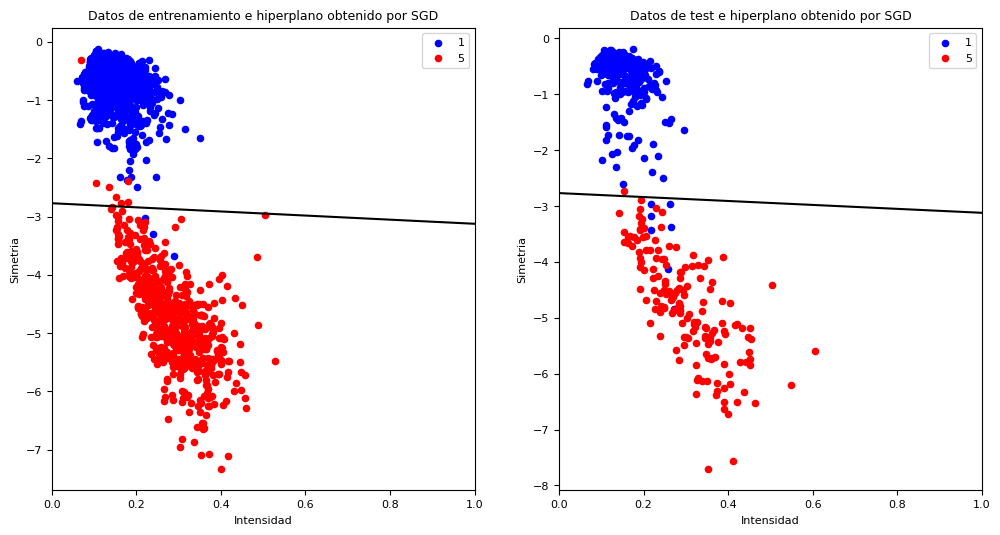

In [512]:
# Graficar datos y linea de regresión
fig = plt.figure(figsize=(12,6))

''' DATOS DE ENTRENAMIENTO '''
d1, d5 = separarDatos(x,y) # Lectura de los datos de entrenamiento 
ax = fig.add_subplot(1, 2, 1) #Num fila, num columna, posicion
plot(d1, d5, w, "Datos de entrenamiento e hiperplano obtenido por SGD") # Dibuja los datos de entrenamiento

''' DATOS DE TEST '''
d1_test, d5_test = separarDatos(x_test,y_test) # Lectura de los datos de entrenamiento 
ax = fig.add_subplot(1, 2, 2) #Num fila, num columna, posicion
plot(d1_test, d5_test, w, "Datos de test e hiperplano obtenido por SGD") # #Dibujamos datos de test

plt.show()

La pseudoinversa es una generalización de la inversa de una matriz que puede aplicarse a matrices que no son cuadradas o que no tienen una inversa regular. La pseudoinversa permite resolver sistemas de ecuaciones lineales cuando el sistema no tiene solución única o no tiene solución en absoluto.

Una forma común de calcular la pseudoinversa de una matriz es utilizando la **descomposición de valores singulares** (SVD, por sus siglas en inglés), que es un método de factorización de matrices que descompone una matriz en otras tres matrices: *U*, *D* y *V*. La pseudoinversa se calcula a partir de la inversa de la matriz diagonal *D* y las matrices *U* y *V*.

La fórmula general para calcular la pseudoinversa de una matriz $X$ es:

$X^† = V·D^†·U^T$

Donde $X$ es la matriz original, $X^†$ es la pseudoinversa, $U^T$ es la traspuesta de la matriz $U$, y $D^†$ es la pseudoinversa de la matriz diagonal $D$.

In [513]:
# Página web de referencia: https://www.section.io/engineering-education/moore-penrose-pseudoinverse/ (lo explica muy bien)

# Función de Pseudoinversa
def pseudoinverse(x, y):
    x_dot = x.T @ x #Obtenemos la matriz cuadrada para la descomposición
  
    U, d, VT = np.linalg.svd(x_dot) # Descomposición de valores singulares. Devuelve U, d, VT
    # VT es la traspuesta de V, no la V en la definición de SVD
    
    # Para conseguir A†, es necesario V y D† de la sálida de SVD anterior
    
    # Calculo de D†:
    D  =  np.diag(d) # Una matriz diagonal a razón del vector d obtenido
    D_inver = np.linalg.inv(D) # Se invierte la matriz
  
    # Calculo de A†: (Donde A es la matriz original, o sea, w en este caso y A† la pseudo-inversa )

    # A†=V·D†·UT y de la descomposición SVD se obtuvo U y VT
    pseudo = VT.T @ D_inver @ U.T # Pseudo-Inversa de X

    w = pseudo @ x.T @ y #Pasa la matriz a vector de pesos

    return w

# Con el método pinv de numpy directamente, debe salir lo mismo 
# def pseudoinverse(x, y):
#     return np.dot(np.dot((np.linalg.pinv(np.dot(x.T,x))),x.T),y)

Los valores de Ein y Eout de la pseudoInversa son ligeramente mejores que el SGD y se ajusta mejor al modelo.

In [514]:
w = pseudoinverse(x, y)

print ('\nBondad del resultado para el algoritmo de la pseudoinversa:\n')
print ("Ein: ", MSE(x,y,w))
pacierto(x[:, 1:],y)
print ("Eout: ", MSE(x_test, y_test, w))
pacierto(x_test[:, 1:],y_test)


Bondad del resultado para el algoritmo de la pseudoinversa:

Ein:  0.07918658628900395
El porcentaje de acierto es de 99.48750800768738 %
Eout:  0.1309538372005258
El porcentaje de acierto es de 98.34905660377359 %


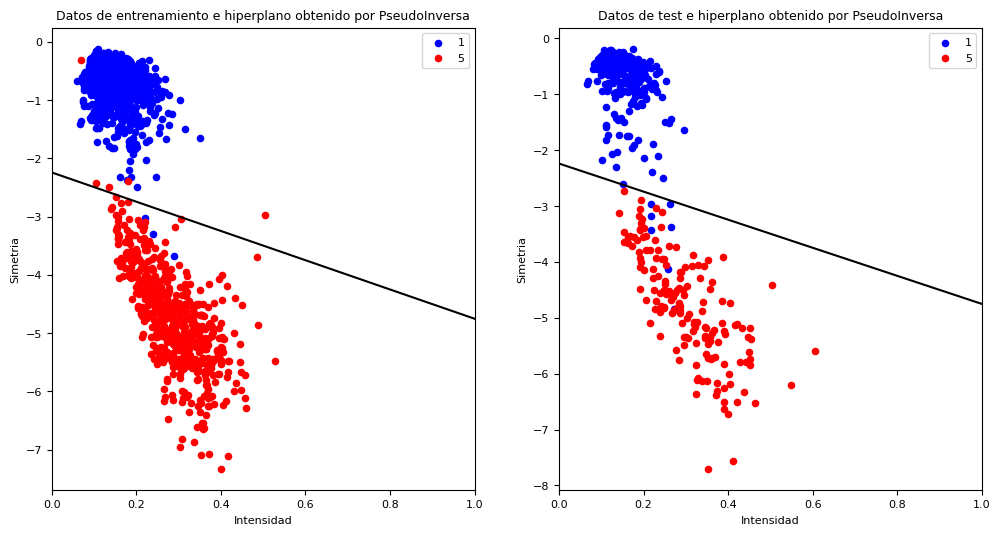

In [515]:
# Graficar datos y linea de regresión
fig = plt.figure(figsize=(12,6))

''' DATOS DE ENTRENAMIENTO '''
ax = fig.add_subplot(1, 2, 1) #Num fila, num columna, posicion
plot(d1,d5,w,"Datos de entrenamiento e hiperplano obtenido por PseudoInversa") #Dibujamos el hiperplano y la linea de regresion de los datos de entrenamiento

''' DATOS DE TEST '''
ax = fig.add_subplot(1, 2, 2) #Num fila, num columna, posicion
plot(d1_test,d5_test,w,"Datos de test e hiperplano obtenido por PseudoInversa") #Dibujamos el hiperplano y la linea de regresion de los datos de test

plt.show()

<font color='blue'>¿Qué ventajas e inconvenientes presenta el uso de la pseudoinversa con respecto a gradiente descendente y viceversa?</font>

El uso de la pseudoinversa y el gradiente descendente tienen ventajas e inconvenientes en diferentes situaciones.

- La Pseudoinversa es una solución analítica que nos da el valor exacto de los pesos que minimizan el error cuadrático medio. 
  - La principal ventaja de este método es que nos proporciona una solución cerrada y exacta, **sin necesidad de iteraciones**. Además, suele ser mucho más rápido que el gradiente descendente cuando el número de características (o atributos) es pequeño. 
  - Sin embargo, cuando el número de características es muy grande, calcular la pseudoinversa puede ser **computacionalmente costoso** y requerir mucha memoria.
Además, la pseudoinversa puede ser inestable cuando la matriz de características es casi singular o cuando hay colinealidad entre las características.
---
- El Gradiente Descendente, por otro lado, es un método iterativo que se basa en la actualización gradual de los pesos en la dirección que minimiza el error. 
  - La principal ventaja de este método es que es **escalable** por lo que puede utilizarse en problemas de regresión con grandes conjuntos de datos y muchas características. Además, el gradiente descendente puede ser mucho más rápido que la pseudoinversa en situaciones donde el número de características es grande. Y por último, el GD es capaz de manejar características no lineales mediante el uso de transformaciones de características (último apartado). 
  - Sin embargo, el gradiente descendente no garantiza una solución exacta y puede quedarse **atrapado en mínimos locales** o puntos de silla. Además, la elección de la tasa de aprendizaje (learning rate) y la estrategia de actualización de pesos puede ser crítica para el éxito del método.

### <font color='blue'>(3 puntos) En este apartado exploramos cómo se transforman los errores $E_{in}$ y $E_{out}$ cuando aumentamos la complejidad del modelo lineal usado. 
Ahora hacemos uso de la función $simula\_unif(N, 2, size)$ que nos devuelve $N$ coordenadas 2D de puntos uniformemente muestreados dentro del cuadrado definido por $[-size, size] \times [-size, size]$. Se debe realizar el siguiente experimento:</font>



In [516]:
# Simula datos en un cuadrado [-size,size]x[-size,size]
def simula_unif(N, d, size):
    return np.random.uniform(-size,size,(N,d))

<font color='blue'>a) Generar una muestra de entrenamiento de $N = 1000$ puntos en el cuadrado
$\mathcal{X} =[-1, 1] \times [-1, 1]$. Pintar el mapa de puntos 2D.</font>




Muestra N = 1000, cuadrado [-1,1]x[-1,1]


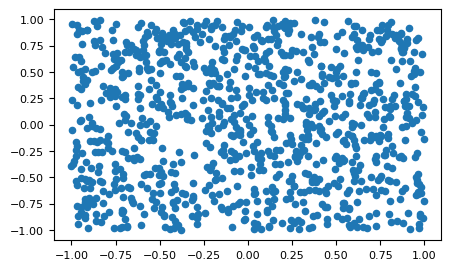

In [517]:
np.random.seed(1) # Para reproducibilidad

# a) Muestra de entrenamiento N = 1000, cuadrado [-1,1]x[-1,1]
x_simul = simula_unif(1000, 2, 1) # 1000 puntos de 2 dimensiones en una cuadrícula de [-1,1]x[-1,1]
fig, ax = plt.subplots(figsize=(5,3))

ax.scatter(x_simul[:,0], x_simul[:,1], c='tab:blue', marker = "o", s=20)
print("Muestra N = 1000, cuadrado [-1,1]x[-1,1]")
plt.show() 


<font color='blue'>b) Consideremos la función $f(x_1, x_2) = sign((x_1 - 0.2)^2 + x^2_2 - 0.6)$ que usaremos para asignar una etiqueta a cada punto de la muestra anterior. Introducimos
ruido sobre las etiquetas cambiando el signo de un 10\% de las mismas elegido aleatoriamente. Pintar el mapa de etiquetas obtenido. </font>



Se ha construido un metodo `etiquetar` para etiquetar los datos. 

Cabe recalcar que aunque numpy contiene en sus librerı́as una función denominada `numpy.sign`, ésta no considera al $0$ con un signo, si no que lo considera 0, sin más. Por eso se ha construido una utilidad sign de forma que de salir 0, este se considere como etiqueta 1.

Para introducir un ruido aleatorio, se ha tomado el conjunto de etiquetas generado a raiz de la función $f(x_1, x_2)$ mencionada en el enunciado del ejercicio y se ha cambiado el valor de un porcentaje indicado de las etiquetas. Es decir, donde se ha obtenido como signo `-1` se ha cambiado a `1`, y viceversa.

Muestra N = 1000, cuadrado [-1,1]x[-1,1]
con etiquetas y ruido en el 10% de las etiquetas


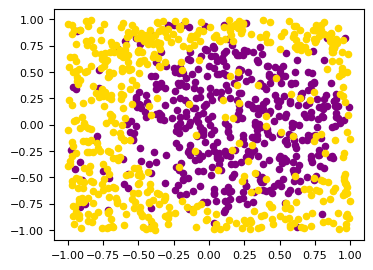

In [518]:
np.random.seed(1) # Para reproducibilidad

# b) Usamos la función f2 para asignar etiquetas a la muestra x e introducimos 
# ruido al 10% de las mismas

# Funcion signo
def sign(x):
    if x >= 0:
        return 1
    return -1

def f(x1, x2):
    return sign((x1-0.2)**2+x2**2-0.6) 

def introducir_ruido(y,porcent_ruido):
    y_ = y.copy()
    for i in range(int(len(y_)*porcent_ruido)): # Un 10% del vector y, es decir 100 iteraciones
        r = np.random.randint(0, len(y_)) # Obtiene un índice aleatorio
        y_[r] = -y_[r] # Intercambia signo
    return y_

# Se asigna una etiqueta a cada punto generado por la función simula_unif
def etiquetar(x):
    y_ = []
    for i in range(len(x)):
        y_.append(f(x[i][0], x[i][1]))
        
    return y_
  
y_simul = etiquetar(x_simul)
y_ruido = introducir_ruido(y_simul, 0.10) # 10%
# Lectura de los datos de entrenamiento 
x1, x2 = separarDatos(x_simul,y_ruido)
x1 = np.array(x1)
x2 = np.array(x2)
#Definimos ax
fig, ax = plt.subplots(figsize=(4,3))

#Dibujamos los datos
ax.scatter(x1[:,0], x1[:,1], c='purple', marker = "o", s=20)
ax.scatter(x2[:,0], x2[:,1], c='gold', marker = "o", s=20)

print ('Muestra N = 1000, cuadrado [-1,1]x[-1,1]')
print ('con etiquetas y ruido en el 10% de las etiquetas')

plt.show()


<font color='blue'>c) Usando como vector de características $(1, x_1, x_2)$, ajustar un modelo de regresion
lineal al conjunto de datos generado y estimar los pesos $w$. Estimar el error de
ajuste $E_{in}$ y el porcentaje de acierto en clasificación usando SGD.</font>




Para ajustar el modelo de regresión, en primer lugar se ha formado el vector de características de la forma indicada, añadiendo 1 al principio de cada punto.

- El valor de $E_{in}$ dentro de la muestra es alto: $0.9258012830405231$. Esto se debe a que le resulta casi imposible de determinar una manera óptima de encontrar un hiperplano que separe ambas clases.

- Efectivamente, la separación generada en la gráfica no coincide con una representación idónea de la división de ambas clases.

- Si calculamos el porcentaje de acierto en clasificación es bastante bajo: 41.0 %

Pruebas:
- Aumentando el *tamaño de minibatch* tarda más y obtiene ligeramente peor resultado.
- Disminuir el *tamaño de minibatch* no cambia hasta M=1 donde por alguna razón el porcentaje de acierto aumenta al 60% aún teniendo el mismo error cuadrático.
- Aumentar el *lr* lleva a que los pesos tomen valores más erráticos hasta salirse de la gráfica.
- Disminuir el *lr* lleva a que no le dé tiempo a minimizar y el $E_{in}$ siga siendo alto.
- Aumentar las *iteraciones* por encima de 500 solo hace que tarde más con el mismo resultado.
- Disminuir las *iteraciones* por debajo de 500 provoca que cada vez tenga menos iteraciones de entrenamiento y ajusta peor.


Bondad del resultado para el algoritmo de SGD:

Ein:  0.9257644562811622
Muestra N = 1000, cuadrado [-1,1]x[-1,1]
con etiquetas y ruido en el 10% de las etiquetas
El porcentaje de acierto es de 40.699999999999996 %


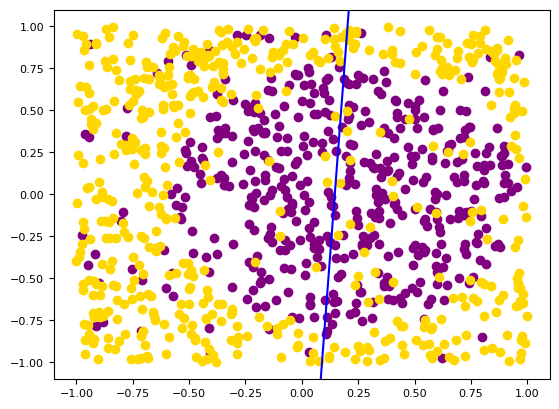

In [519]:
# c) Modelo de regresión lineal, estimar Ein con SGD
M = 32
iter = 500
lr = 0.01

# Creamos una matriz de unos para insertar la característica
unos = np.ones((1, 1), dtype=int)

# Usamos la función insert() para insertar los unos en la posición 0 de cada fila
x_simul_ones = np.insert(x_simul, 0, unos, axis=1) # Vectores (1, x1, x2)
y_ruido = np.array(y_ruido)

# Calculamos los pesos con los datos con sus características lineales.
w = sgd(x_simul_ones,y_ruido,lr,iter, M)

x_simul_ones = np.array(x_simul_ones)
print ('Bondad del resultado para el algoritmo de SGD:\n')
print ("Ein: ", (MSE(x_simul_ones,y_ruido,w)))

#Definimos ax
fig, ax = plt.subplots()

# Calcular la línea de regresión lineal
line_x = np.linspace(-1, 1, 100)
y = f_recta(line_x)

#Dibujamos los datos
ax.scatter(x1[:,0], x1[:,1], c='purple', marker = "o")
ax.scatter(x2[:,0], x2[:,1], c='gold', marker = "o")
ax.plot(line_x, y, color="blue")

print ('Muestra N = 1000, cuadrado [-1,1]x[-1,1]')
print ('con etiquetas y ruido en el 10% de las etiquetas')
pacierto(x_simul,y_ruido)

plt.xlim([-1.1, 1.1])
plt.ylim([-1.1, 1.1])

plt.show()

<font color='blue'>d) Ejecutar todo el experimento definido por (a)-(c) 1000 veces (generamos 1000
muestras diferentes) y

- <font color='blue'>Calcular el valor medio de los errores $E_{in}$ de las 1000 muestras.</font>

- <font color='blue'>Generar 1000 puntos nuevos por cada iteración y calcular con ellos el valor
de  $E_{out}$ en dicha iteración. Calcular el valor medio de $E_{out}$ en todas las
iteraciones.</font>


Para cada repetición ejecutamos los siguientes pasos:

1. Generamos puntos aleatorios, etiquetamos con la función e introducimos ruido.
2. Ajustamos el modelo a esos nuevos puntos y obtenemos el $E_{in}$ de esa iteración y lo sumamos.
3. Volvemos a ejecutar el paso 3.
4. Calculamos $E_{out}$ sin reentrenar el modelo.

Finalmente dividimos los errores $E_{in}$ y $E_{out}$ entre el número de iteraciones para obtener el valor medio:

$E_{in} =0.8875467244211137$ \\
$E_{out} =0.8932368071553267$


In [520]:
# d) Ejecutar el experimento 1000 veces

errores_in = 0.0
errores_out = 0.0
N = 1000
d = 2
size = 1
repeticiones = 1000
M = 32

for i in range(repeticiones):

    x_r_simul = simula_unif(N, d, size) # como deben ser diferentes, se generan en cada iteración
    y_r = etiquetar(x_r_simul) # Etiquetamos
    introducir_ruido(y_r, 0.10) # 10% de ruido
    x_r_ones = np.c_[np.ones(N), x_r_simul] # vector (1, x1, x2)
    
    w_r_simul = sgd(x_r_ones, y_r, lr, N, M) # Se aplica SGD a un conjunto de datos con ruido
    
    # Error dentro de la muestra
    x_r_ones = np.array(x_r_ones)
    y_r = np.array(y_r)
    ein = MSE(x_r_ones, y_r, w_r_simul)
    errores_in = errores_in + ein

    # 1000 puntos para el conjunto Test y obtener Eout
    x_test_simul = simula_unif(N, d, size)
    y_test_simul = etiquetar(x_test_simul)
    introducir_ruido(y_test_simul, 0.10) # 10%
    x_test_simul = np.c_[np.ones(N), x_test_simul]

    # Error fuera de la muestra  
    x_test_simul = np.array(x_test_simul)
    y_test_simul = np.array(y_test_simul)
    eout = MSE(x_test_simul, y_test_simul, w_r_simul)
    errores_out = errores_out + eout

print ('\t\t\tBondad del resultado para grad. descendente estocastico:')
print ("\t\t\t\tEin Medio: ", errores_in/repeticiones)
print ("\t\t\t\tEout Medio: ", errores_out/repeticiones)
print()


			Bondad del resultado para grad. descendente estocastico:
				Ein Medio:  0.887922878745954
				Eout Medio:  0.8937569781456621




<font color='blue'>e) Valore qué tan bueno considera que es el ajuste con este modelo lineal a la vista
de los valores medios obtenidos de $E_{in}$ y $E_{out}$.</font>

Los valores de error son terribles, ya que se encuentra muy próximos a $1$, algo que igualmente ya se podı́a observar en la representación anterior de los puntos y su ajuste.

El modelo lineal no se ajusta bien a la función de los datos. Una posible explicación se pueda deber a que:
- Los datos entre las clases se encuentren muy dispersos, que con ruido no ayuda.
- Los datos no son separables con etiquetas de clases lineales ya que como podemos observar en la figura anterior, el conjunto de datos púrpura tiene forma de eclipse.

<font color='blue'>Repetir el mismo experimento anterior pero usando características no lineales. Ahora
usaremos el siguiente vector de características: $\phi_2(x) = (1, x_1, x_2, x_1x_2, x^2_1, x^2_2)$. Ajustar
el nuevo modelo de regresión lineal y calcular el nuevo vector de pesos $\hat{w}$. Calcular
los errores promedio de $E_{in}$ y $E_{out}$.

A la vista de los resultados de los errores promedios $E_{in}$ y $E_{out}$ obtenidos en los dos
experimentos, ¿qué modelo considera que es el más adecuado? Justifique la respuesta.</font>

In [521]:
#Hay que adaptar las funciones para el caso no lineal

#Funcion no lineal
def f_no_lineal(x1, x2):
  return w_nolineal[0] + x1*w_nolineal[1] + x2*w_nolineal[2] + x1*x2*w_nolineal[3] + ((x1)**2)*w_nolineal[4] + ((x2)**2)*w_nolineal[5]

def pacierto_nl(x_dat):
  y_regresion = []
  for point in x_dat:
    if(f_no_lineal(point[0], point[1]) > 0): # Si está fuera de la elipse, asigna 1
      y_regresion.append(1)
    else:
      y_regresion.append(-1) # Si está dentro de la elipse, asigna -1

  acierto = 0
  error = 0
  for y1,y2 in zip(y_ruido, y_regresion): # Compara la similitud de las etiquetas calculadas con las reales
    if(y1 == y2):
      acierto += 1
    else:
      error += 1
  print("\t\t\tEl porcentaje de acierto es de", (acierto/(acierto+error))*100, "%")

El procedimiento es ligeramente diferente al lineal:
1. Simulamos los datos
2. Transformamos los datos a vectores no lineales con las características dadas
3. Calculamos el SGD con los datos no lineales
4. Imprimimos el error $E_{in}$
5. Repetimos paso 1 y 2
6. Imprimimos el error $E_{out}$ sin reentrenar el modelo

Podemos observar que los errores se reducen drásticamente y que el porcentaje de acierto asciende por encima del 85%. Esto se debe a que efectivamente la elipse separa satisfactoriamente el conjunto de datos púrpura del otro.

			Ein No Lineal:  0.34768445129936276
			Eout No Lineal:  0.3565789517291155
			El porcentaje de acierto es de 86.4 %
w calculado:  [-0.81584501 -0.57300908  0.04241716  0.03749418  1.11062942  1.57208075]


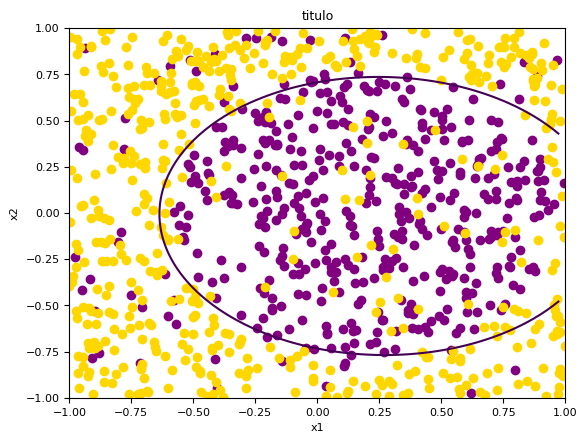

In [522]:
np.random.seed(1)
# Genera un vector de características no lineal de la forma
# (1, x1, x2, x1·x2, x1^2, x2^2)
N = 1000
d = 2
size = 1
def generar_vector_no_lineal(x_, N):
    nolineal = np.c_[np.ones(N), x_]
    nolineal = np.c_[nolineal, np.ones(N)]
    nolineal = np.c_[nolineal, np.ones(N)]
    nolineal = np.c_[nolineal, np.ones(N)]
    nolineal[:,3] = nolineal[:, 1]*nolineal[:, 2]
    nolineal[:,4] = nolineal[:, 1]**2
    nolineal[:,5] = nolineal[:, 2]**2

    return nolineal

# Se genera un vector no lineal de la forma (1, x1, x2, x1·x2, x1^2, x2^2)
x_= simula_unif(N, d,size)
y_= etiquetar(x_)
introducir_ruido(y_, 0.10) # 10%
x_nolineal = generar_vector_no_lineal(x_, N) # Genera la matriz con el vector de características no lineal

w_nolineal = np.array([0.0,0.0,0.0,0.0,0.0,0.0]) #Inicializa
w_nolineal = sgd(x_nolineal, y_, lr, 1000, M)

x_nolineal = np.array(x_nolineal)
y_ = np.array(y_)
print ("\t\t\tEin No Lineal: ", MSE(x_nolineal, y_, w_nolineal))

# Generamos el conjunto de test
x_test_ = simula_unif(N, d,size)
y_test_ = etiquetar(x_test_)
introducir_ruido(y_test_, 0.10) # 10%

x_test_nolineal = generar_vector_no_lineal(x_test_, N) # Genera la matriz con el vector de características no lineal

x_test_nolineal = np.array(x_test_nolineal)
y_test_ = np.array(y_test_)
print ("\t\t\tEout No Lineal: ", MSE(x_test_nolineal, y_test_, w_nolineal))

pacierto_nl(x_simul)

print ("w calculado: ",w_nolineal)

#Definimos ax
fig, ax = plt.subplots()

# Calcular la línea de regresión lineal

x_range = np.arange(-1,1,0.025) # rango de valores para X
y_range = np.arange(-1,1,0.025) # rango de valores para Y
valor_x, valor_y = np.meshgrid(x_range, y_range) # se hace un muestreo de los datos

ax.scatter(x1[:,0], x1[:,1], c='purple', marker = "o")
ax.scatter(x2[:,0], x2[:,1], c='gold', marker = "o")
plt.contour(valor_x, valor_y,f_no_lineal(valor_x, valor_y), [0])

plt.xlabel("x1")
plt.ylabel("x2")
plt.title("titulo")
                  
plt.axis([-1,1,-1,1])

plt.show()

Repetimos el experimento ejecutando el fragmento anterior 1000 veces

In [523]:

  
### AHORA PROBAMOS CON CARACTERÍSTICAS NO LINEALES ####
errores_in = 0.0
errores_out = 0.0
N = 1000
d = 2
size = 1
repeticiones = 1000
M = 32

for i in range(repeticiones):

    x_r_simul = simula_unif(N, d, size) # como deben ser diferentes, se generan en cada iteración
    y_r = etiquetar(x_r_simul)
    x_r_nl = generar_vector_no_lineal(x_r_simul, N)
    
    w_r_nl = np.array([0.0,0.0,0.0,0.0,0.0,0.0])
    
    w_r_nl = sgd(x_r_nl, y_r, lr, 1000, M) # Se aplica SGD a un conjunto de datos con ruido
    
    # Error dentro de la muestra
    x_r_nl = np.array(x_r_nl)
    y_r = np.array(y_r)
    ein = MSE(x_r_nl, y_r, w_r_nl)
    errores_in = errores_in + ein
    
    # 1000 puntos para el conjunto Test y obtener Eout
    
    x_test_simul = simula_unif(N, d,size)
    y_test_simul = etiquetar(x_test_simul)
    x_test_simul = generar_vector_no_lineal(x_test_simul, N)

    # Error fuera de la muestra    
    x_test_simul = np.array(x_test_simul)
    y_test_simul = np.array(y_test_simul)
    eout = MSE(x_test_simul, y_test_simul, w_r_nl)
    errores_out = errores_out + eout


print ('\t\t\tBondad del resultado para grad. descendente estocastico con características No-Lineales:')
print ("\t\t\t\tEin Medio: ", errores_in/repeticiones)
print ("\t\t\t\tEout Medio: ", errores_out/repeticiones)
print()

			Bondad del resultado para grad. descendente estocastico con características No-Lineales:
				Ein Medio:  0.37528340477328515
				Eout Medio:  0.3791788738723543





---

## <font color='blue'> Bonus (2 puntos). Método de Newton

El BONUS solo se tendrá en cuenta si se ha obtenido al menos el 75\% de los puntos de la
parte obligatoria.</font>

<font color='blue'>Implementar el algoritmo de minimización de Newton y aplicarlo a la función $f(x, y) = (x - 2)^2 + 2(y + 2)^2 + 2 sin(2 \pi x) sin(2 \pi y)$. Comiéncese desde los puntos iniciales $(-4.0, 4.0)$ y $(0.4,0.0)$, usando dos tasas de aprendizaje ($0.1$ y $0.01$), y $250$ iteraciones. Haga lo mismo con la función $g(x,y)=(x + 2)^2 + 3(y - 1)^2$ (mismos puntos de inicio, tasas de aprendizaje e iteraciones). 
</font>

<font color='blue'>Extraiga conclusiones sobre el comportamiento de los algoritmos comparando la curva de
decrecimiento de la función con el método de Newton y con el  gradiente descendente, tanto en esta función ($g(x,y)$) como en la anterior ($f(x,y)$). Debe mostrarse también una tabla que asocie puntos iniciales y tasas de aprendizaje con las coordenadas alcanzadas y el valor de la función en dichos puntos finales.

¿Se observa alguna diferencia en el comportamiento del método de Newton en estas funciones? De ser así, ¿a qué puede deberse? ¿Qué ventajas e inconvenientes presenta el método de Newton en contraposición al gradiente descendente?</font>



### <font color='blue'> $f(x, y) = (x - 2)^2 + 2(y + 2)^2 + 2 sin(2 \pi x) sin(2 \pi y)$</font>

Para el método de Newton necesitaremos la primera y segunda derivada tanto para el Gradiente como para la Hessiana.

La Hessiana es una matriz cuadrada de segundas derivadas parciales de una función. Tiene la estructura siguiente:

$
\mathbf{H}(f) = 
\begin{bmatrix}
    \frac{\partial^2 f}{\partial x^2} & \frac{\partial^2 f}{\partial x \partial y} \\[0.3em]
    \frac{\partial^2 f}{\partial y \partial x} & \frac{\partial^2 f}{\partial y^2}
\end{bmatrix}
$

Donde:

- La fila 0 contiene la segunda derivada respecto a **x** y la segunda derivada respecto a **x** e **y**.
- La fila 1 contiene la segunda derivada respecto a **y** e **x** y la segunda derivada respecto a **y**.

In [ ]:
def E1(w):
    x = w[0]
    y = w[1]
    return (x-2)**2 + 2*(y+2)**2 + 2*np.sin(2*np.pi*x)*np.sin(2*np.pi*y)
# Derivada parcial de E respecto de u
def E_u1(w):
    x = w[0]
    y = w[1]
    return 2*x + 4*np.pi*np.sin(2*np.pi*y)*np.cos(2*np.pi*x) - 4

# Derivada parcial de E respecto de v
def E_v1(w):
    x = w[0]
    y = w[1]
    return 4*y + 4*np.pi*np.sin(2*np.pi*x)*np.cos(2*np.pi*y) + 8
    
# Gradiente de E
def gradE1(w):
    return np.array([E_u1(w), E_v1(w)])

def Hessian1(point):
    x = point[0]
    y = point[1]
    d2f_dx2 = -8*np.pi**2*np.sin(2*np.pi*x)*np.sin(2*np.pi*y) + 2
    d2f_dyx = 8*np.pi**2*np.cos(2*np.pi*x)*np.cos(2*np.pi*y)
    d2f_dy2 = -8*np.pi**2*np.sin(2*np.pi*x)*np.sin(2*np.pi*y) + 4
    return (np.matrix([[d2f_dx2, d2f_dyx], [d2f_dyx, d2f_dy2]]))

El método de Newton-Raphson es un algoritmo de optimización numérica utilizado para encontrar los ceros (puntos donde la función se anula) de una función no lineal. Es un método iterativo que utiliza la primera y segunda derivada de la función para aproximar el valor del cero.

El método de Newton-Raphson comienza con una aproximación inicial $x_0$ del cero de la derivada de la función. Luego, en cada iteración $k$, se calcula una nueva aproximación $x_{k+1}$ utilizando la siguiente fórmula:

$x_{k+1} = x_k - \frac{f'(x_k)}{f''(x_k)}
$​
 

donde $f'(x_k)$ es la primera derivada de la función evaluada en $x_k$, y $f''(x_k)$ es la segunda derivada de la función evaluada en $x_k$. Esta fórmula se utiliza en cada iteración del método para obtener una nueva aproximación $x_{k+1}$ del mínimo o máximo de la función.

El método de Newton-Raphson es muy eficiente para minimizar funciones suaves y con derivadas continuas, ya que converge rápidamente hacia el mínimo o máximo local de la función. Sin embargo, el método puede fallar en algunas situaciones, como cuando la función tiene múltiples mínimos o máximos locales, o cuando la matriz Hessiana (la matriz de segundas derivadas) no es **definida positiva** o no es simétrica. En estos casos, se pueden utilizar variantes del método de Newton-Raphson, como el método de Newton modificado o el método de Levenberg-Marquardt, para mejorar la convergencia del método.

Para implementarlo en código hay que expandir la fórmula de iteración:

$x_{k+1} = x_k - H_f(x_k)^{-1} \nabla f(x_k)$

donde $\nabla f(x_k)$ es el vector gradiente de la función evaluado en $x_k$, y $H_f(x_k)^{-1}$ es la inversa de la matriz hessiana de la función evaluada en $x_k$.

Esta fórmula se utiliza en cada iteración del método para obtener una nueva aproximación $x_{k+1}$ del mínimo de la función, utilizando la aproximación anterior $x_k$ y los valores del gradiente y la hessiana de la función evaluados en $x_k$. La hessiana de la función se utiliza para obtener una mejor aproximación del mínimo local de la función, ya que tiene en cuenta la curvatura de la función en el punto $x_k$.

Si queremos añadir el learning rate, basta con multiplicarlo por la hessiana y el gradiente de la forma:

$x_{k+1} = x_k - lr· H_f(x_k)^{-1} \nabla f(x_k)$

Esta modificación del método de Newton se le llama **relaxed Newton-Raphson method**.

In [ ]:
"""
Encuentra el mínimo de la función f(w) utilizando el método de Newton-Raphson.

Parámetros:
w: punto de partida de la iteración
lr: tasa de aprendizaje
grad_fun: función que calcula el gradiente de f(w)
fun: función objetivo a minimizar f(w)
H: función que calcula la matriz hessiana de f(w)
max_iters: máximo número de iteraciones

Retorna:
w: aproximación del mínimo de la función f(w)
"""
# Metodo de Newton
def newtonMethod(w, lr, grad_fun, fun, H, epsilon = 1e-6, max_iters=250):
    # Inicializar variables
    k = 0
    error = epsilon + 1
    ws = []
    # Iterar hasta cumplir la tolerancia o el máximo número de iteraciones
    while error > epsilon and k < max_iters:
        # Calcular la siguiente aproximación
        grad = grad_fun(w)
        hess = H(w)
        inv_hess = np.linalg.inv(hess)
        gradH = np.array((inv_hess @ grad))
        w_next = w - lr * gradH[0]

        # Calcular el error
        error = abs(fun(w_next) - fun(w))
        
        # Actualizar las variables
        w = w_next
        ws.append(w)
        k += 1
    
    return w, k, ws


In [ ]:
epsilon = 1e-6
max_iters = 250

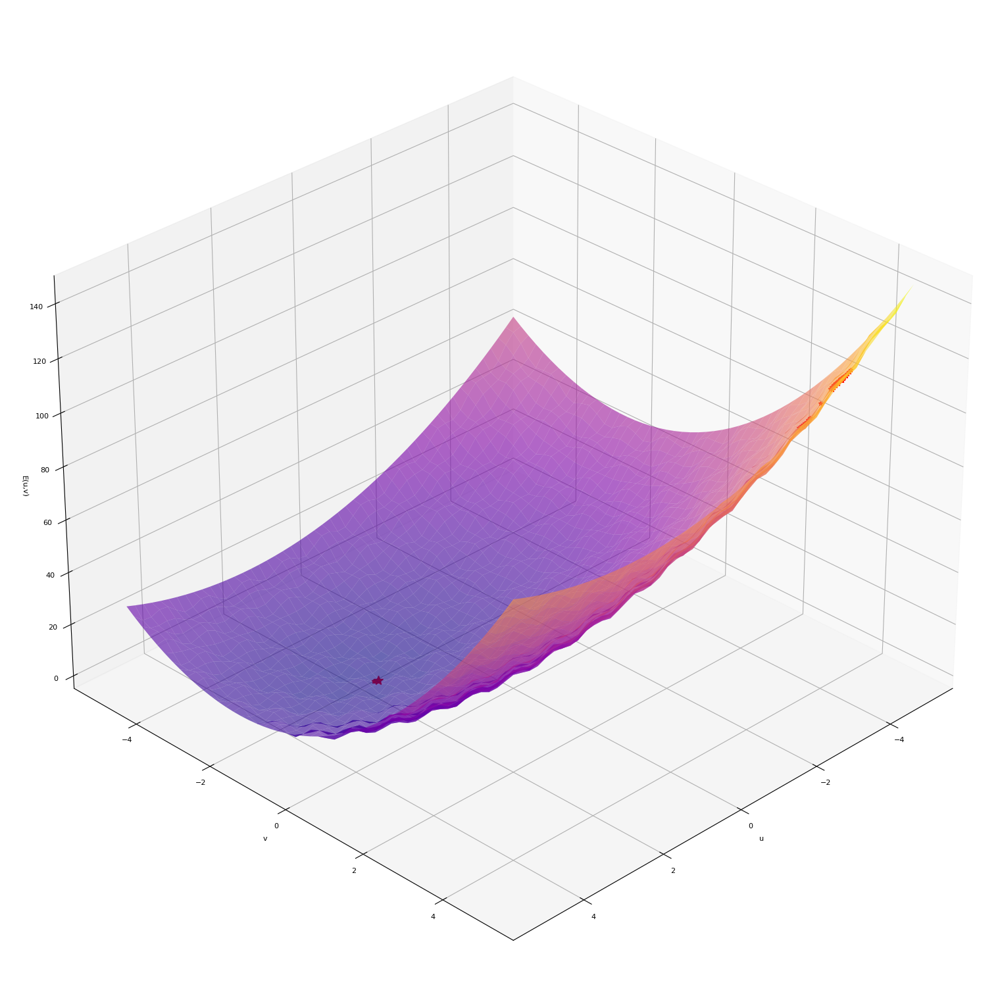

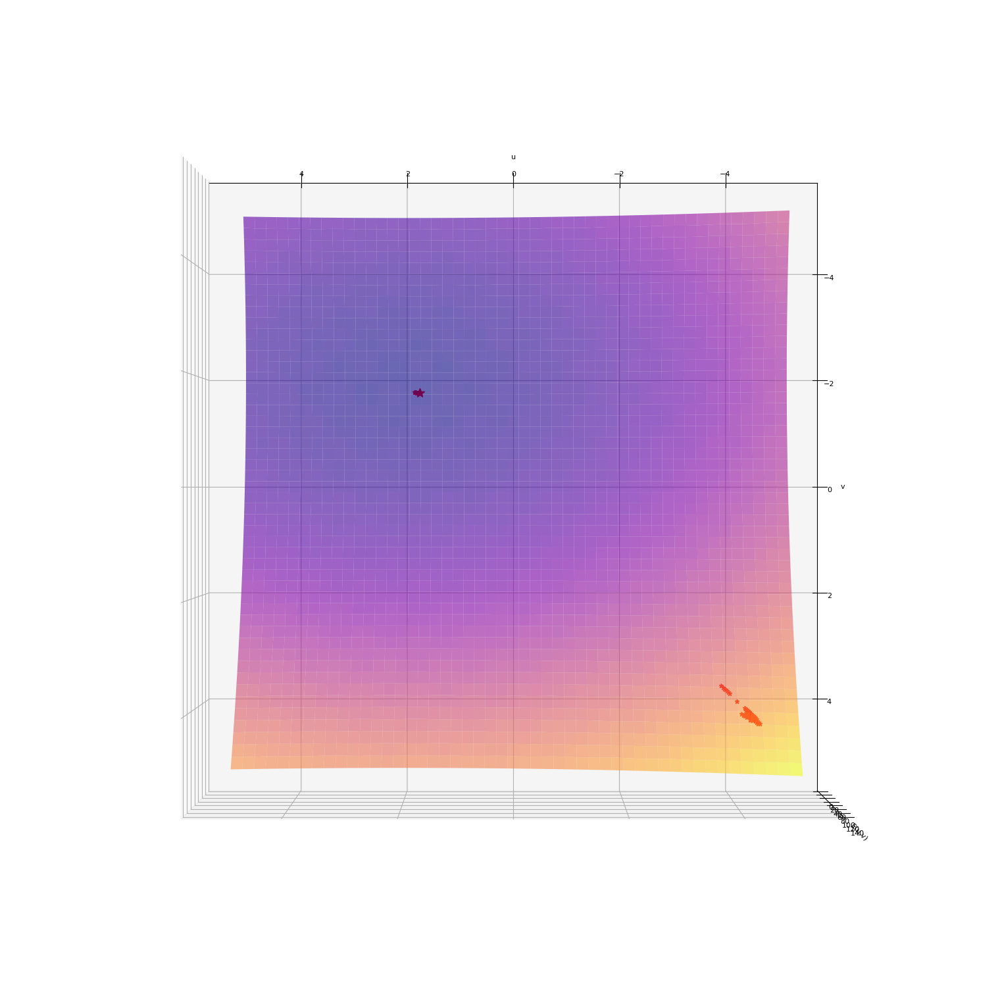

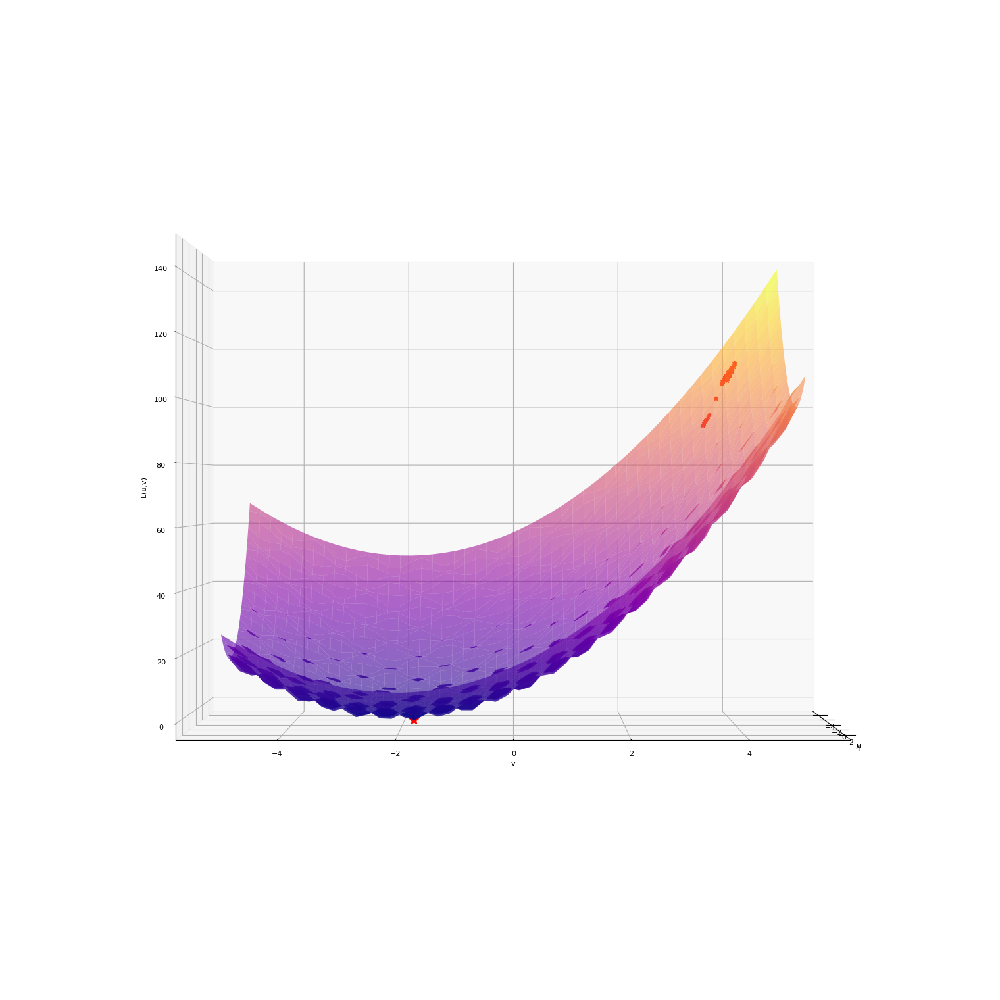

In [524]:
w = np.array([-4.0,4.0])
w, k, ws = newtonMethod(w, 0.1, gradE1, E1, Hessian1, epsilon, max_iters)

display_figure(5, E1, ws, [45,30], 'plasma','')
display_figure(5, E1, ws, [90,90], 'plasma','')
display_figure(5, E1, ws, [0,0], 'plasma','')

### <font color='blue'> $g(x,y)=(x + 2)^2 + 3(y - 1)^2$</font>

In [525]:
def E2(w):
    x = w[0]
    y = w[1]
    return (x+2)**2 + 3*(y-1)**2
# Derivada parcial de E respecto de u
def E_u2(w):
    x = w[0]
    y = w[1]
    return 2*x + 4

# Derivada parcial de E respecto de v
def E_v2(w):
    x = w[0]
    y = w[1]
    return 6*y - 6
    
# Gradiente de E
def gradE2(w):
    return np.array([E_u2(w), E_v2(w)])

def Hessian2(point):
    x = point[0]
    y = point[1]
    d2f_dx2 = 2
    d2f_dyx = 0
    d2f_dy2 = 6
    return (np.matrix([[d2f_dx2, d2f_dyx], [d2f_dyx, d2f_dy2]]))

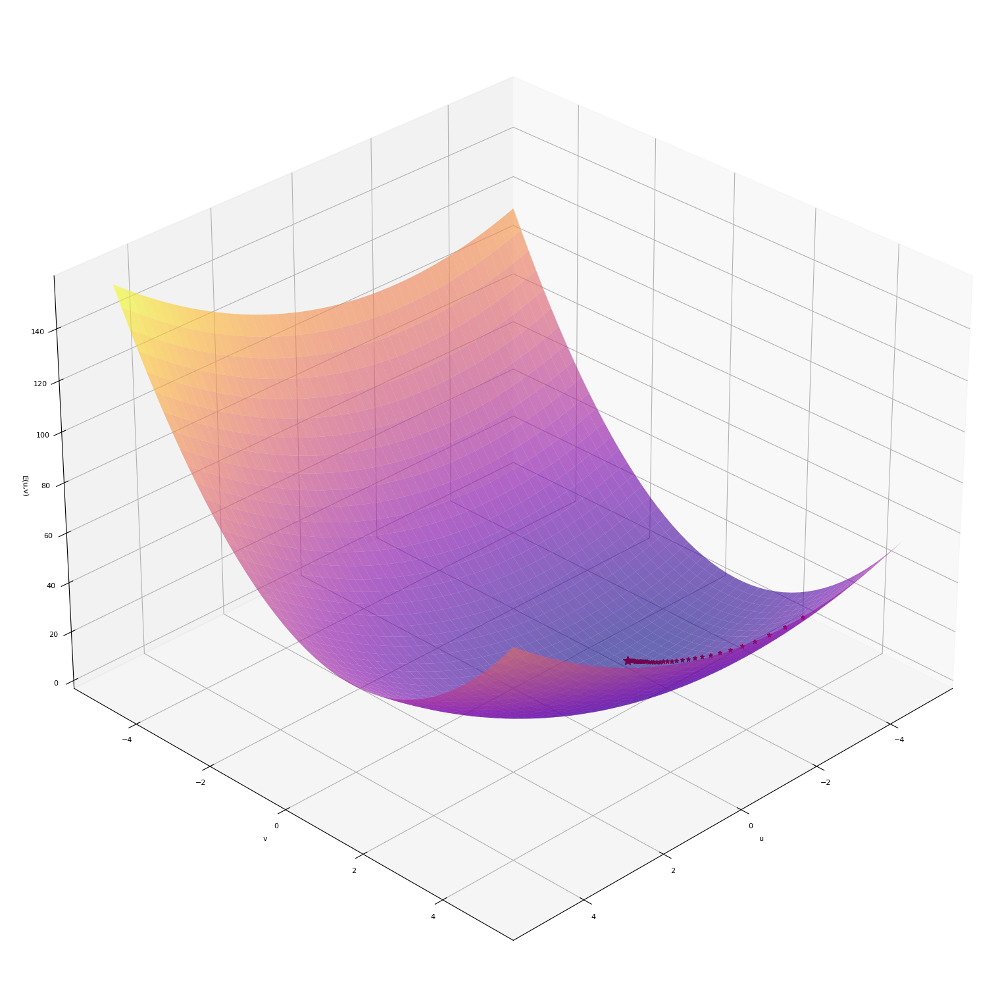

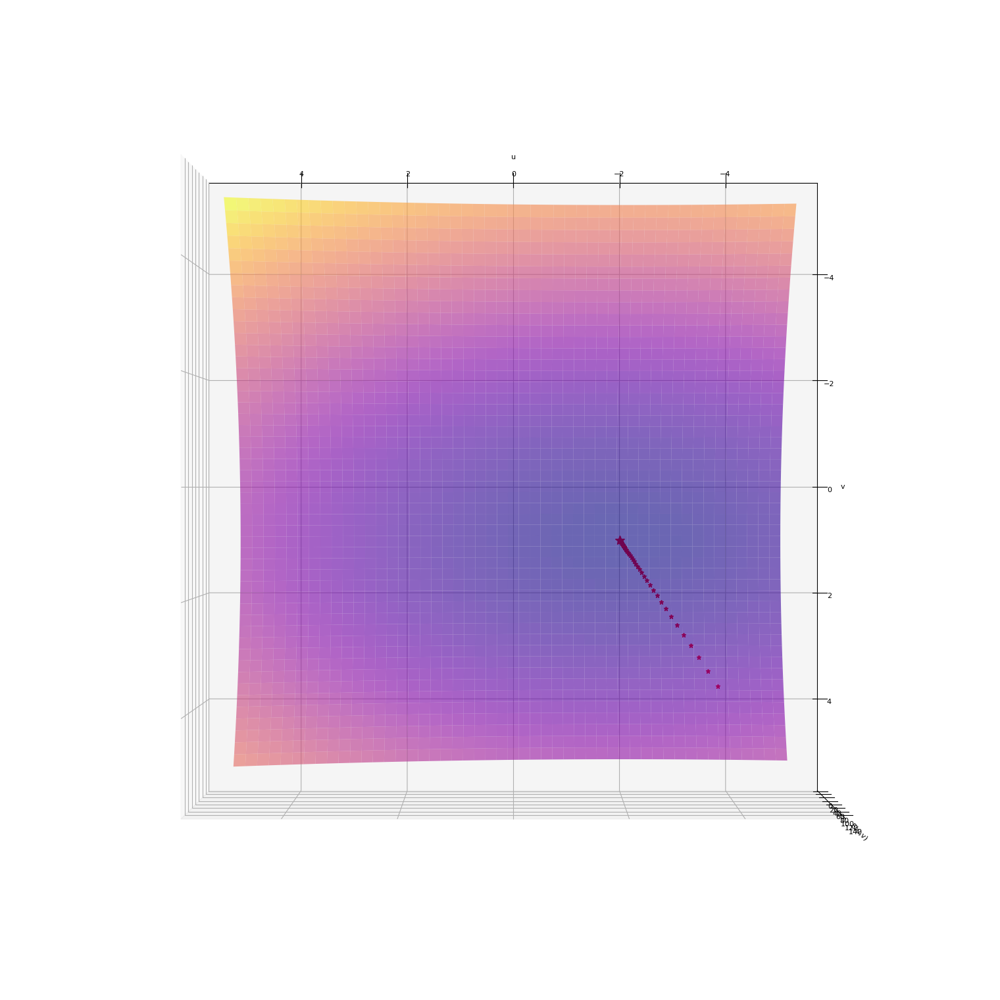

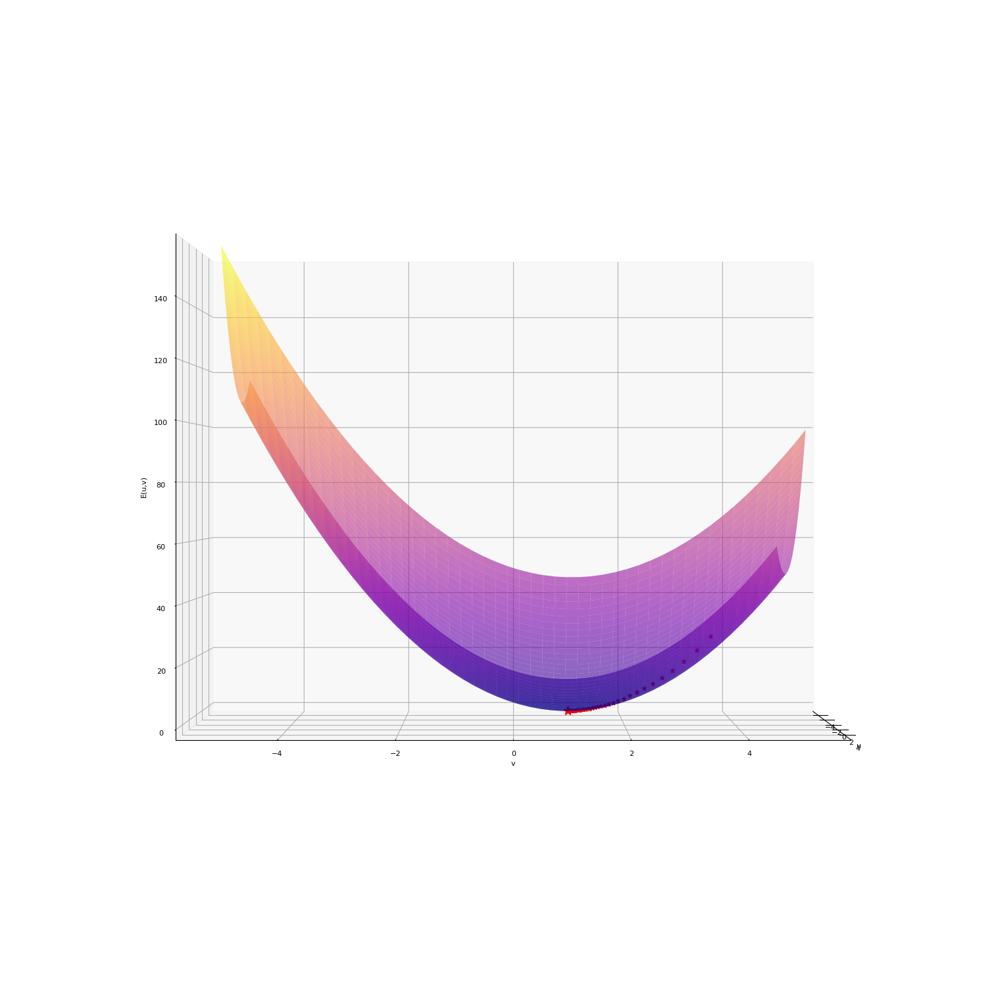

In [526]:
w = np.array([-4.0,4.0])
w, k, ws = newtonMethod(w, 0.1, gradE2, E2, Hessian2, epsilon, max_iters)

display_figure(5, E2, ws, [45,30], 'plasma','')
display_figure(5, E2, ws, [90,90], 'plasma','')
display_figure(5, E2, ws, [0,0], 'plasma','')

### <font color='blue'> Comparativa global. </font>

Podemos observar que:
- En la función $f(x,y)$ el método de Newton converge o diverge según el punto de partida. Esto es debido a que hay varias derivadas en 0 (provocados por los senos y cosenos, en el dibujo de la función se ve lo ondulada que está).
- En la función $g(x,y)$ el método de Newton converge perfectamente y de forma casi instantánea. Esto pasa ya que las derivadas son suaves y es una función muy sencilla.

In [527]:
from IPython.display import display, Latex

# Definimos los puntos iniciales
puntos_iniciales = [[-4.0,4.0],[4.0,4.0],[-0.2,-3.0],[0.4,0.0]]

# Creamos una lista para almacenar los resultados
resultados1, resultados2 = [], []
wsT1, wsT2 = [],[]
w = [0,0]
lr = 0.1
# Iteramos sobre los puntos iniciales y las tasas de aprendizaje
for punto_inicial in puntos_iniciales:
    ws = []
    # Aplicamos el método de newton para encontrar el mínimo
    w, k, ws = newtonMethod(punto_inicial, lr, gradE1, E1, Hessian1, epsilon, max_iters)
    # Almacenamos los resultados en una lista
    resultados1.append([punto_inicial, lr, w, E1(w)])
    wsT1.append(ws)

# Iteramos sobre los puntos iniciales y las tasas de aprendizaje
for punto_inicial in puntos_iniciales:
    ws = []
    # Aplicamos el método de newton para encontrar el mínimo
    w, k, ws = newtonMethod(punto_inicial, lr, gradE2, E2, Hessian2, epsilon, max_iters)
    # Almacenamos los resultados en una lista
    resultados2.append([punto_inicial, lr, w, E2(w)])
    wsT2.append(ws)

# Creamos un dataframe con los resultados
df_resultados1 = pd.DataFrame(resultados1, columns=['Punto inicial', 'Tasa de aprendizaje', 'Coordenadas alcanzadas', 'Valor de la función'])
df_resultados2 = pd.DataFrame(resultados2, columns=['Punto inicial', 'Tasa de aprendizaje', 'Coordenadas alcanzadas', 'Valor de la función'])
#Imprimimos el dataframe
display(Latex("$f(x, y) = (x - 2)^2 + 2(y + 2)^2 + 2 sin(2 \pi x) sin(2 \pi y)$"))
display(df_resultados1)
display(Latex("$g(x,y)=(x + 2)^2 + 3(y - 1)^2$"))
display(df_resultados2)

<IPython.core.display.Latex object>

,Punto inicial,Tasa de aprendizaje,Coordenadas alcanzadas,Valor de la función
0,"[-4.0, 4.0]",0.1,"[1.756195034652754, -1.7620741789340806]",-1.820079
1,"[4.0, 4.0]",0.1,"[7.750303926275654, 5.097343740310874]",132.662170
2,"[-0.2, -3.0]",0.1,"[0.051670074706092556, -2.9469512382808847]",5.798149
3,"[0.4, 0.0]",0.1,"[0.6125533701871553, -0.0469073822312805]",9.931600


<IPython.core.display.Latex object>

,Punto inicial,Tasa de aprendizaje,Coordenadas alcanzadas,Valor de la función
0,"[-4.0, 4.0]",0.1,"[-2.0000000000738454, 1.0000000001107678]",4.226168e-20
1,"[4.0, 4.0]",0.1,"[-1.9999999998546507, 1.0000000000726748]",3.697128e-20
2,"[-0.2, -3.0]",0.1,"[-1.9999999999515505, 0.9999999998923338]",3.712339e-20
3,"[0.4, 0.0]",0.1,"[-1.9999999998332565, 0.9999999999305238]",4.228423e-20


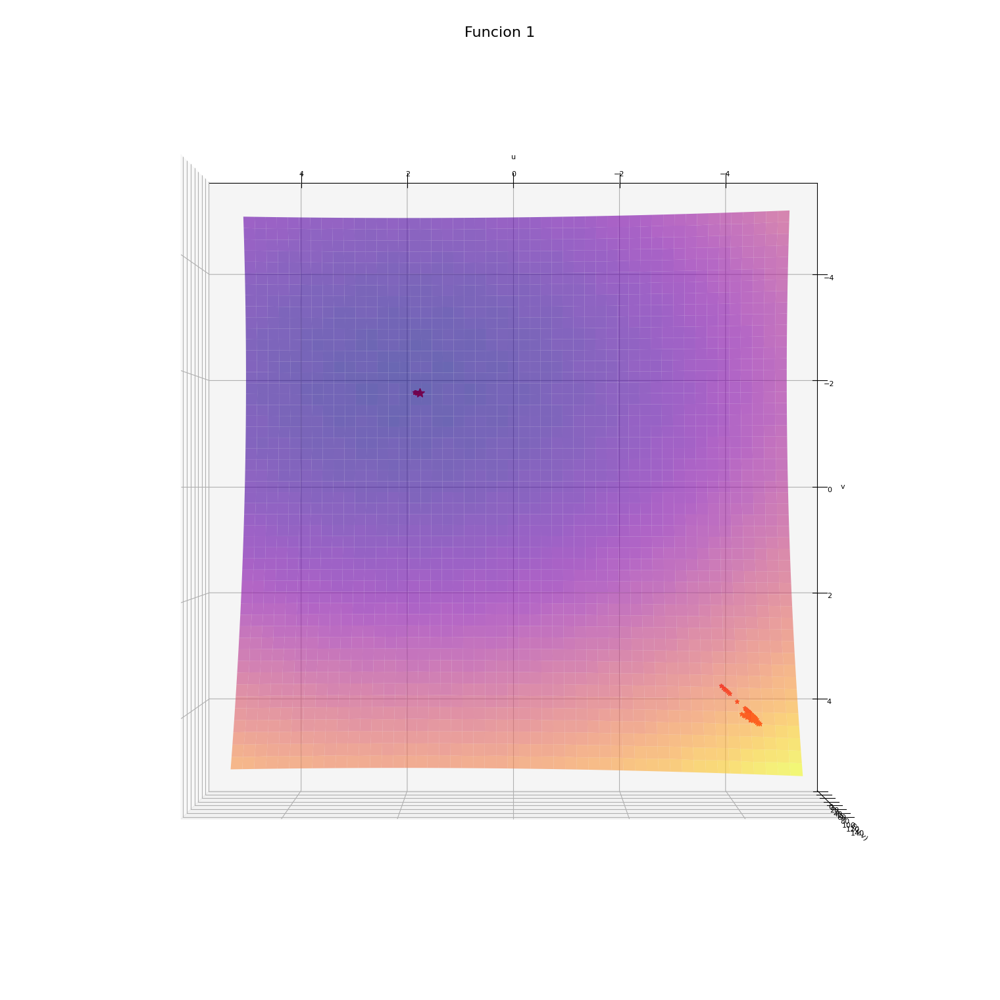

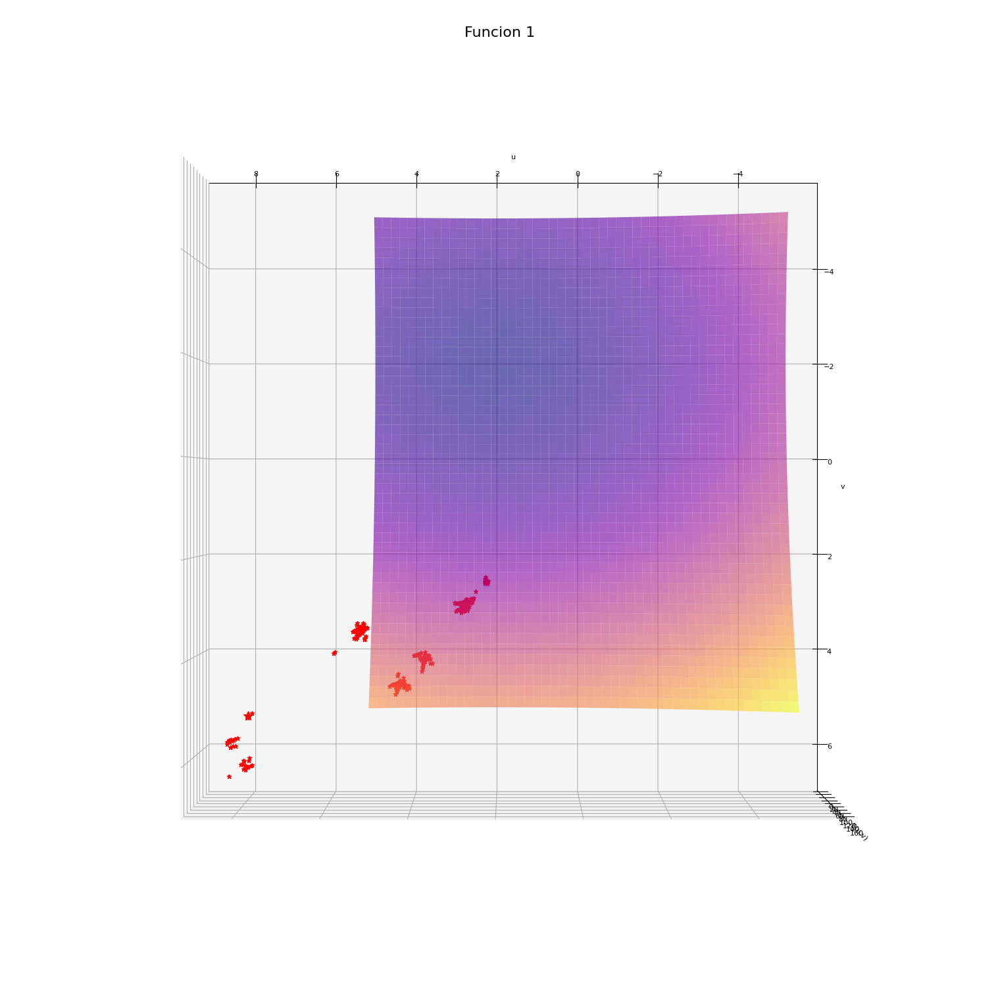

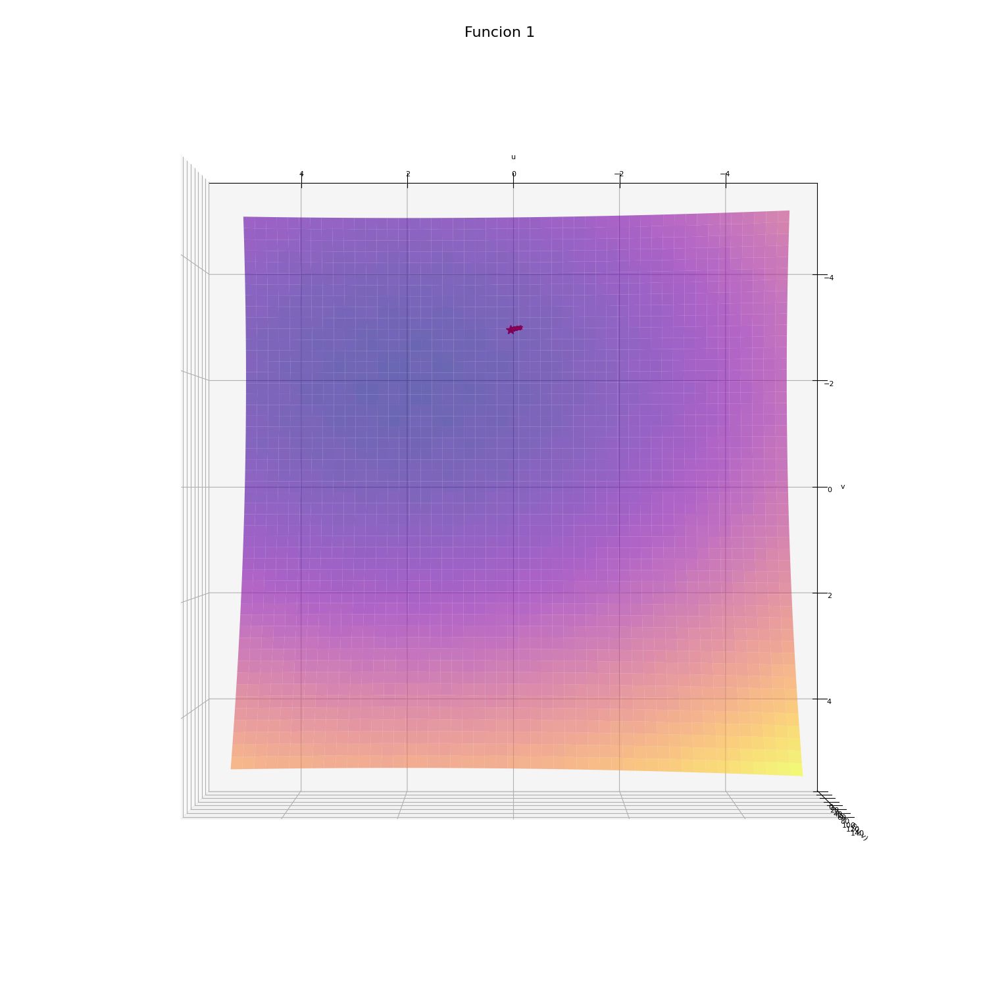

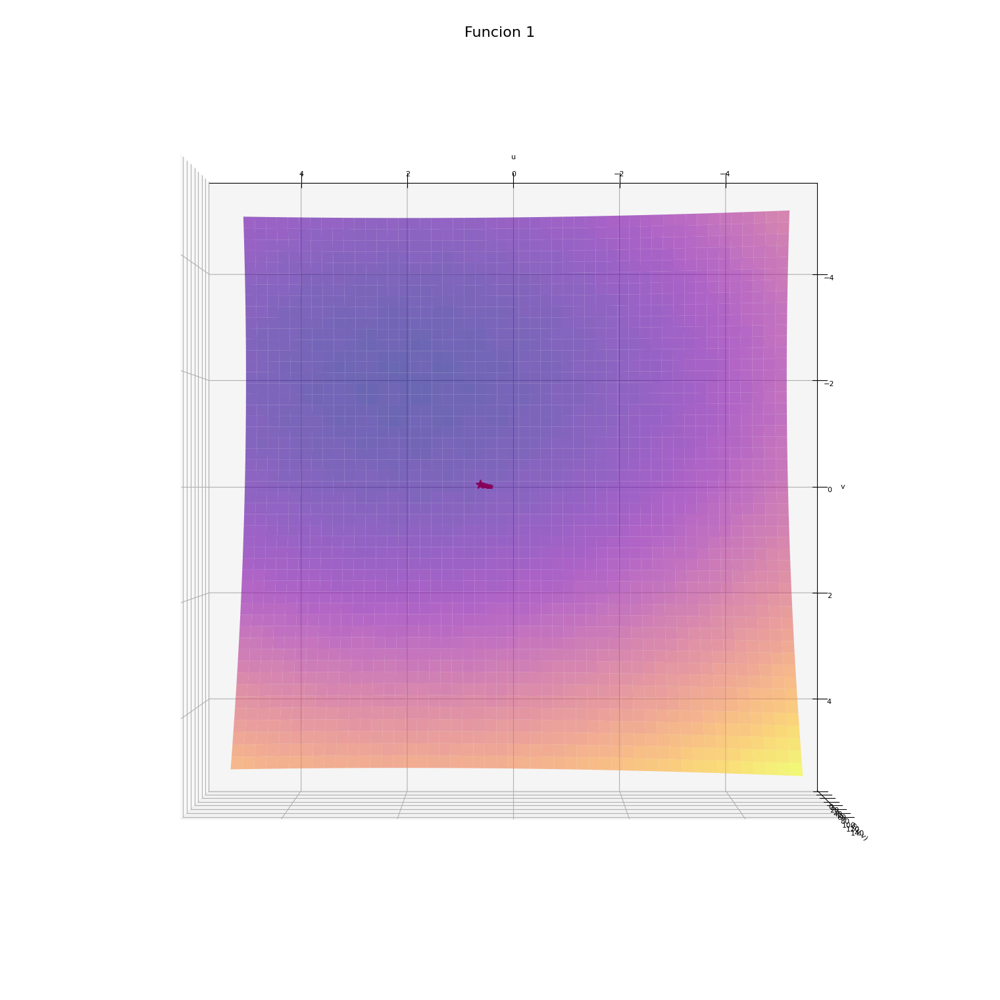

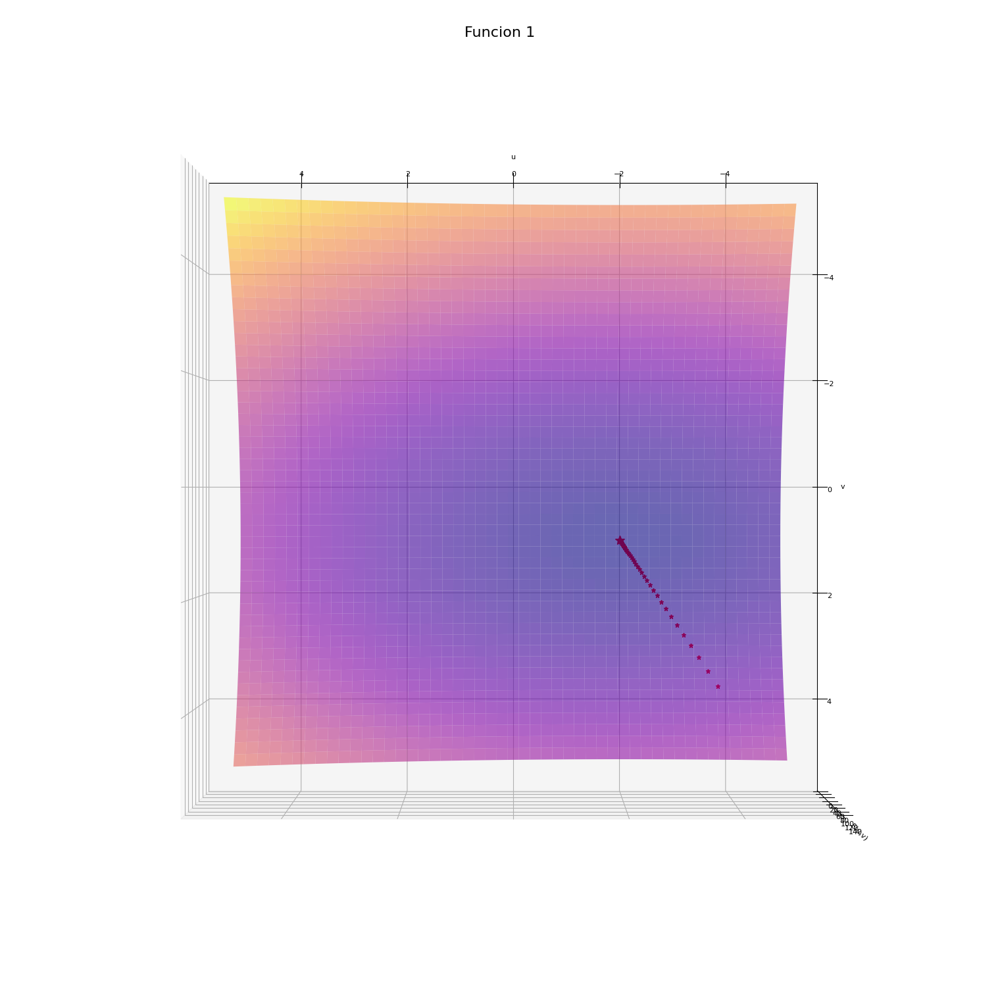

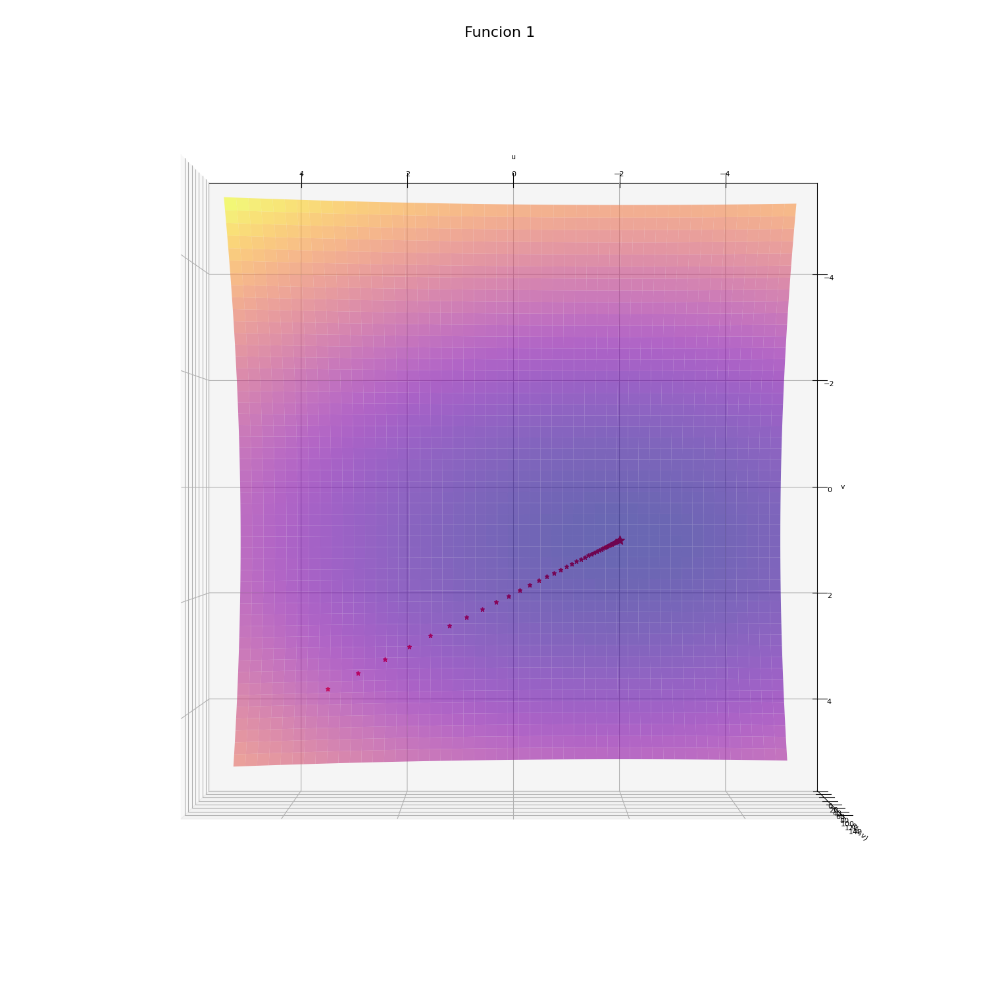

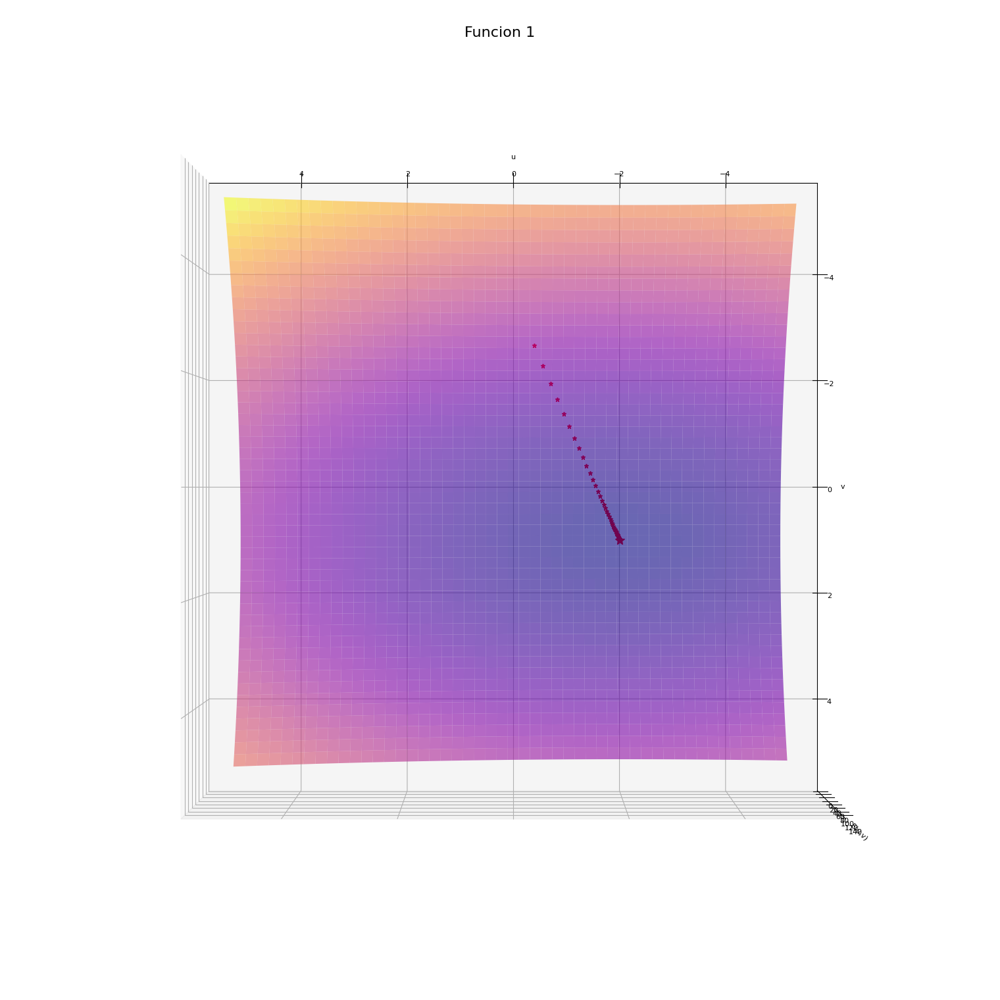

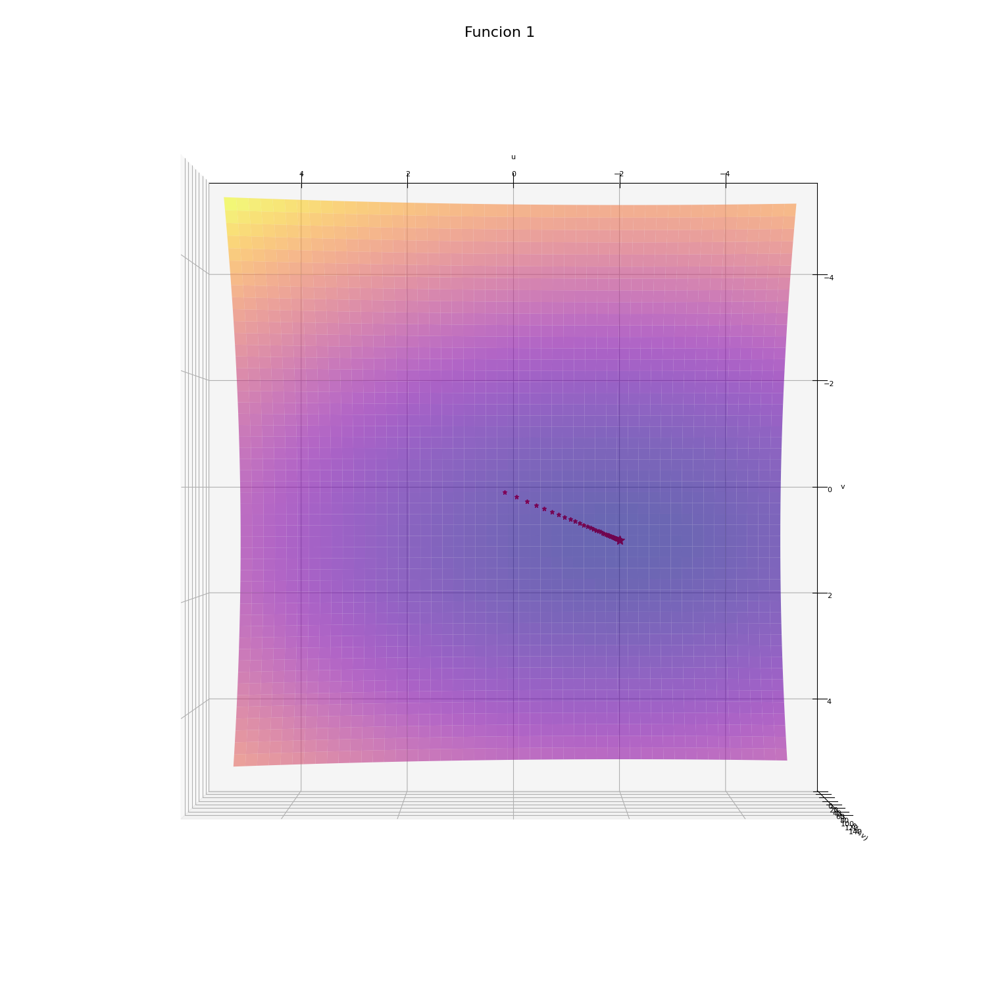

In [528]:
for ws in wsT1:
  display_figure(5, E1, ws, [90,90], 'plasma', 'Funcion 1')
for ws in wsT2:
  display_figure(5, E2, ws, [90,90], 'plasma', 'Funcion 1')

### <font color='blue'> Número de iteraciones necesarias para alcanzar un valor determinado.

Empléese gradiente descendente (usando una tasa de aprendizaje de $0.1$) y el método de Newton (sin learning rate) para minimizar la función $g(x,y)$ desde los puntos $(-4.0, 4.0)$ y $(0.4,0.0)$. Póngase un número máximo de iteraciones de $250$. ¿Cuántas iteraciones necesita cada algoritmo para alcanzar un valor de $1e-20$? </font>

Podemos observar como al ejecutar ambos algoritmos, el método de newton solo ha necesitado 2 iteraciones frente las 250 del gradiente descendente.

Con esto podemos concluir que:

Ventajas del método de Newton-Raphson:

- Es un método muy eficiente en términos de convergencia, ya que puede llegar al mínimo de la función en menos iteraciones que el gradiente descendente.
- Si la función a minimizar es convexa y la hessiana es definida positiva, el método de Newton garantiza la convergencia al mínimo global.
- Puede ser más robusto que el gradiente descendente en términos de la elección de la tasa de aprendizaje, ya que la hessiana proporciona información sobre la curvatura de la función.

Inconvenientes del método de Newton-Raphson:

- El cálculo de la hessiana puede ser costoso, especialmente si la función es de alta dimensionalidad.
- Si la hessiana no es definida positiva, el método puede no converger al mínimo global, incluso si la función es convexa.
- Si la hessiana es singular en el mínimo global, el método puede no converger en absoluto.

En contraste, el gradiente descendente es más simple de implementar y computacionalmente menos costoso. Además, el gradiente descendente puede funcionar bien en problemas de alta dimensionalidad y en problemas donde la hessiana es difícil de calcular o no está disponible. Sin embargo, el gradiente descendente puede ser menos eficiente que el método de Newton-Raphson en términos de convergencia y puede requerir más iteraciones para alcanzar el mínimo de la función.

In [529]:
max_iter = 250
epsilon = 1e-20
w1, k1, ws1 = gd(np.array([-4.0,4.0]), 0.01, gradE2, E2, epsilon, max_iter, show_evol = False)
print ('---Descenso de Gradiente---')
print ('Numero de iteraciones: ', k1)
print ('Coordenadas obtenidas: (', w1[0], ', ', w1[1],')')
print ('Valor de la función en el punto w: ', E2(w))

w2, k2, ws2 = newtonMethod(np.array([-4.0,4.0]), 1, gradE2, E2, Hessian2, epsilon, max_iter)
print ('---Método de Newton---')
print ('Numero de iteraciones: ', k2)
print ('Coordenadas obtenidas: (', w2[0], ', ', w2[1],')')
print ('Valor de la función en el punto w: ', E2(w))


---Descenso de Gradiente---
Numero de iteraciones:  250
Coordenadas obtenidas: ( -4.0 ,  4.0 )
Valor de la función en el punto w:  4.2284225593619406e-20
---Método de Newton---
Numero de iteraciones:  2
Coordenadas obtenidas: ( -2.0 ,  1.0 )
Valor de la función en el punto w:  4.2284225593619406e-20
